<a href="https://colab.research.google.com/github/MohammadDeep/pian-files/blob/main/preproses_function_all_singnall.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# functiones

#### show_df_pec
شیب ها که از یک درصد بیشتر باشد را نشان می دهد و بقیه را برار با میانگین شیب قرار می دهد
به این صورت پیک ها را تا حدی پیدا می کند


In [ ]:
def show_df_pec(signal, perc):
  new_signal = []
  df_signall = df_signal(signal)
  df_signall.append(df_signall[-1])

  max_df = max(df_signall)
  min_df = min(df_signall)
  sum = 0
  for i in df_signall:
    sum = sum + i
  mean = sum / len(df_signall)
  #print(mean)
  for i in df_signall:
    if i > max_df * perc:
      new_signal.append(abs(i))
    elif i < min_df * perc:
      new_signal.append(abs(i))
    else :
      new_signal.append(abs(mean))
  return new_signal



#### dic_show_df_pec

In [ ]:
def dic_show_df_pec(dic_data, perc = 0.4):
  dic_df_pec = {}
  for label, signall in dic_data.items():
    dic_df_pec['show_df_pec_' + label] = show_df_pec(signall, perc)
  return dic_df_pec

#### get_plot

In [ ]:
import matplotlib.pyplot as plt
def get_plot(list_sinales , list_labeles , size_plot = (120 * 3, 6), list_sacale = None, list_alpha=None, alphaes = 0.2 , Fs = 250):
    len_data = len(list_sinales[0])
    second = len_data / Fs
    plt.figure(figsize=size_plot)
    for i in range(len(list_sinales)):
        if list_alpha == None:
          if i  in [0,1]:
            alpha = alphaes
          else:
            alpha = 1
        else :
          alpha = list_alpha[i]


        max = np.max(list_sinales[i])
        min = np.min(list_sinales[i])
        list_sinales[i] = (list_sinales[i] - min) / (max - min)
        if list_sacale is not None:
          list_sinales[i] = list_sinales[i]  * list_sacale[i]
        time = np.linspace(0, second, len(list_sinales[i]))
        plt.plot(time , list_sinales[i], label=list_labeles[i], alpha = alpha)
    if len(list_labeles) == 3:
      plt.title(list_labeles[2])

    plt.xlabel('second')
    plt.ylabel('singnall Value')
    plt.legend()
    plt.show()


#### show_plotes

In [ ]:
def show_plotes(dic_data,size_plot= (120 * .2 , 6),  list_sacale = None, list_alpha = None, alphaes = 0.2):
  for label, signall in dic_data:
    get_plot(list_labels + [signall] , ['COVAS', 'Heater_cleaned', label] , size_plot , list_sacale = None, list_alpha=None)

#### df_signal

In [ ]:
def df_signal(signal , save_len = True):
  df_list = []
  for i in range(len(signal) - 1):
    df_list.append(signal[i + 1] - signal[i])
  if save_len and len(df_list) + 1 == len(signal) :
    df_list.append(df_list[-1])
  return df_list

#### local nim max index

In [ ]:
def local_nim_max_index(signal):
  df_list = df_signal(signal)

  index_min = []
  index_max = []

  for i in range(len(df_list)-1):
    if df_list[i] * df_list[i + 1] < 0:
      if df_list[i] > df_list[i + 1]:
        index_max.append(i)
      else:
        index_min.append(i)
  return {'index_max': index_max ,
          'index_min': index_min}

### window

In [ ]:
import numpy as np
def signal_window(signal, window_size, step = 1, save_len = True):
    # تعداد نمونه‌های سیگنال
    len_signall = len(signal)

    values = []
    if save_len  and step != 1 :
      print('save len is avalabel   -> step = 1')
      step = 1
    # حرکت پنجره بر روی سیگنال
    for i in range((len_signall - window_size)//step + 1):
        window = signal[i * step:i * step + window_size]  # سیگنال در پنجره
        values.append(window)
    if save_len :
      number_add_st = (window_size -1) // 2
      number_add_end = window_size - 1 - number_add_st
      values_str = values[0]
      values_end = values[-1]
      for i in range(number_add_st):
        values.insert(0, values_str[:-i - 1])
      for i in range(number_add_end):

        values.append(values_end[i + 1:])




    list_array  = []
    for i in values:
      list_array.append(np.array(i))
    return list_array

In [ ]:
signal = [1,2,3,4,5,6,7,8,9,10,11]
window_size = 11
aa = signal_window(signal, window_size)

In [ ]:
aa = signal_window(signal, 3, save_len = False)

In [ ]:
aa, len(aa)

([array([1, 2, 3]),
  array([2, 3, 4]),
  array([3, 4, 5]),
  array([4, 5, 6]),
  array([5, 6, 7]),
  array([6, 7, 8]),
  array([7, 8, 9]),
  array([ 8,  9, 10]),
  array([ 9, 10, 11])],
 9)

#### variance_window

In [ ]:
import numpy as np

def variance_window(signal, window_size):
  try :
    a = len(signal[1])
    windows = signal
  except:
    print('create_window')
    windows = signal_window(signal, window_size)
  values = []
  for window in windows:

    values.append(np.var(window))  # محاسبه واریانس پنجره

  return np.array(values)



#### dic_variance_window(dic_data, window_size)

In [ ]:
def dic_variance_window(dic_data, window_size):
  dic_variance = {}
  for label, signall in dic_data.items():
    #print('signal',signall)
    dic_variance['var_' + label] = variance_window(signall, window_size)
  return dic_variance

#### ave_window

In [ ]:
import numpy as np

def ave_window(signal, window_size):
  try :
    a = len(signal[1])
    windows = signal
  except:
    print('create_window')
    windows = signal_window(signal, window_size)
  values = []
  for window in windows:

    values.append(np.mean(window))  # محاسبه واریانس پنجره

  return np.array(values)


#### range_window

In [ ]:
def range_window(signal, window_size):
  try :
    a = len(signal[1])
    windows = signal
  except:
    print('create_window')
    windows = signal_window(signal, window_size)
  values = []
  for window in windows:

    values.append(np.max(window) - np.min(window))  # محاسبه واریانس پنجره

  return np.array(values)

#### max_window

In [ ]:
def max_window(signal, window_size):
  try :
    a = len(signal[1])
    windows = signal
  except:
    print('create_window')
    windows = signal_window(signal, window_size)
  values = []
  for window in windows:

    values.append(np.max(window) )  # محاسبه واریانس پنجره

  return np.array(values)

#### min_window

In [ ]:
def min_window(signal, window_size):
  try :
    a = len(signal[1])
    windows = signal
  except:
    print('create_window')
    windows = signal_window(signal, window_size)
  values = []
  for window in windows:

    values.append(np.min(window))  # محاسبه واریانس پنجره

  return np.array(values)

In [ ]:
def create_data_for_dataFrame(
                Seconds,
                 signall,
                 name_signall : str,
                 window  = None ,
                 step = 1
                ):

  len_seconds = len(Seconds)
  len_signall = len(signall)
  if window is not None:
    number_window = ((len_seconds - window) // step)  + 1
    if number_window != len_signall:
      print('len window seconde != len signall')
      return 0
    window_seconds = []
    for i in range(number_window):
      window_seconds.append([i, i + window])

    data = {
        'window Second' : window_seconds,
        name_signall : signall
        }
    return data
  elif len_signall != len_seconds:
    print('len_signall != len_second')
    return 0
  else:
    data = {
        'Seconds': Seconds,
        name_signall : signall
    }
    return data


# Read data

In [ ]:
number_persoin =52 #37#44#23#30

In [ ]:


from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
list_columns = ['Seconds',
            'Bvp',
            'Eda_E4',
            'Tmp',
            'Ibi',
            'Hr',
            'Resp',
            'Eda_RB',
            'Ecg',
            'Emg',
            'Heater [C]',
            'COVAS',
            'Heater_cleaned']

In [ ]:
import pandas as pd
def read_csv_file(number = 1):
    PATH_FILE = '/content/drive/MyDrive/dataset/PainMoint/extracted_files/PMED/PMHDB/raw-data/'


    list_columns = ['Seconds',
                'Bvp',
                'Eda_E4',
                'Tmp',
                'Ibi',
                'Hr',
                'Resp',
                'Eda_RB',
                'Ecg',
                'Emg',
                'Heater [C]',
                'COVAS',
                'Heater_cleaned']



    number = str(number).zfill(2)

    file_path = PATH_FILE + 'S_' + number + '-synchronised-data.csv'
    df = pd.read_csv(file_path, sep=';', skipinitialspace=True, engine='python', on_bad_lines='skip')





    for i1 in list_columns:
      df[i1] = df[i1].str.replace(',', '.').astype(float)
    return df
df = read_csv_file(number_persoin)
df.head()

,Seconds,Bvp,Eda_E4,Tmp,Ibi,Hr,Resp,Eda_RB,Ecg,Emg,Heater [C],COVAS,Heater_cleaned
0,0.000,-6.243317,0.103512,33.01,0.896393,66.953793,0.003815,8.445358,-0.007370,-0.007027,32.060,0.0,32.0
1,0.004,-4.928009,0.103491,33.01,0.896181,66.969034,0.004578,8.466721,-0.004532,0.011124,32.134,0.0,32.0
2,0.008,-3.922375,0.103470,33.01,0.895969,66.984275,-0.015259,8.472633,0.000572,0.014053,32.208,0.0,32.0
3,0.012,-2.916742,0.103449,33.01,0.895757,66.999516,0.012207,8.463669,-0.014557,0.005173,32.282,0.0,32.0
4,0.016,-1.911108,0.103428,33.01,0.895545,67.014757,-0.001526,8.471107,-0.018837,-0.007050,32.356,0.0,32.0


In [ ]:
# prompt: delet None in df and reset index

df.dropna(inplace=True)
df.reset_index(drop=True, inplace=True)


In [ ]:
list_labels = [df['COVAS'], df['Heater_cleaned']]

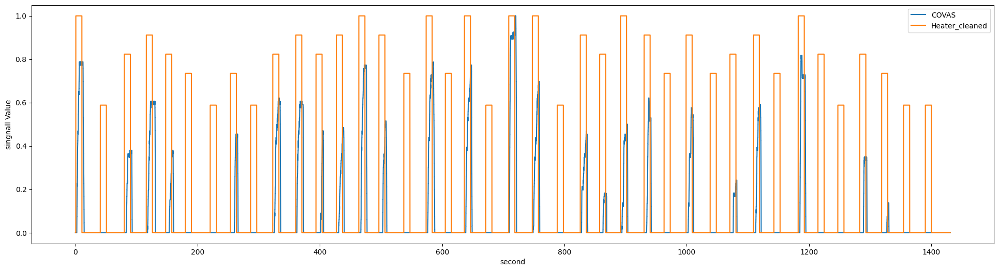

In [ ]:
get_plot( list_labels , ['COVAS' , 'Heater_cleaned'] , size_plot = (120 * .2, 6), list_sacale = None, list_alpha=None, alphaes = 1)

# Heater_cleaned and pain

In [ ]:
# read all data
Heater_cleaned, COVAS = [], []
from tqdm import tqdm
for i in tqdm(range(36)):
  df = read_csv_file(i+ 1)
  Heater_cleaned.append(df['Heater_cleaned'])
  COVAS.append(df['COVAS'])


100%|██████████| 36/36 [06:09<00:00, 10.26s/it]


In [ ]:
all_Heater_cleaned = [ii for i in Heater_cleaned for ii in i]
all_COVAS = [ii for i in COVAS for ii in i]

In [ ]:
df = pd.DataFrame({'all_Heater_cleaned': all_Heater_cleaned,'all_COVAS': all_COVAS})

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde

In [ ]:
def window_Heater_cleaned(Heater_cleaned, pain_signall, second = 13 , Fs = 250, show = False):

  unique_values = set(Heater_cleaned)
  data = { str(val): [] for val in unique_values }
  ii = 0
  list_index = []
  for i in  (Heater_cleaned == 32)& (Heater_cleaned.shift(-1) != 32):
    if i:

      list_index.append(ii)
    ii = ii + 1


  for i in range(len(list_index)):
    index = list_index[i] + 1
    pain_window = pain_signall[index : min(index + second * Fs, len(pain_signall))]
    if index < min(index + second * Fs, len(pain_signall)):
      max_pain = max(pain_window)
      #print(str(Heater_cleaned[index + 20]))
      data[str(Heater_cleaned[index + 20])].append([i ,int( max_pain)])
  if show :
    x = [float(key) for key in data.keys() for i in data[key]]
    y = [i[1] for key in data.keys() for i in data[key] ]

    # ۱) محاسبه چگالی با KDE
    xy = np.vstack([x, y])
    z  = gaussian_kde(xy)(xy)

    # ۲) مرتب‌سازی برای اینکه نقاط کم‌چگال زیر نقاط پرچگال نباشند
    idx = z.argsort()
    x_arr = np.array(x)
    y_arr = np.array(y)
    z_arr = np.array(z)
    z_norm = np.zeros_like(z_arr)
    for ux in np.unique(x_arr):
        mask = (x_arr == ux)
        max_z = z_arr[mask].max()
        if max_z > 0:
            z_norm[mask] = z_arr[mask] / max_z
    # 3) مرتب‌سازی بر حسب چگالی نرمال‌شده
    idx = z_norm.argsort()
    x_s, y_s, z_s = x_arr[idx], y_arr[idx], z_norm[idx]
    # ۳) رسم scatter با cmap معکوس خاکستری
    plt.figure()
    sc = plt.scatter(x_s, y_s, c=z_s, cmap='gray_r')
    plt.xlabel('Temp')
    plt.ylabel('Pain')
    plt.title('Density-colored scatter (white=0, black=max)')
    plt.colorbar(sc, label='Density')
    plt.show()


  return data ,x ,y



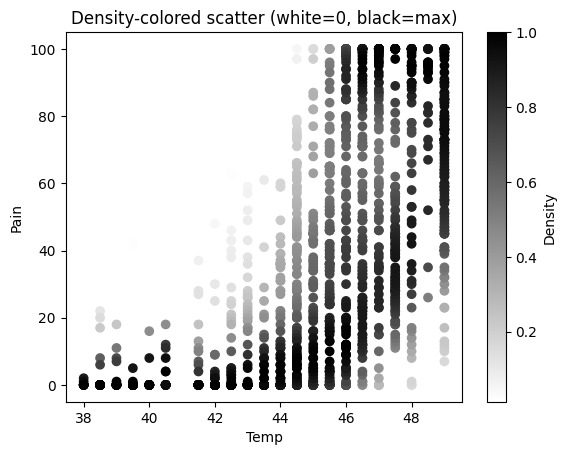

In [ ]:
Pain_data, x, y = window_Heater_cleaned( df['all_Heater_cleaned'],df['all_COVAS'], second = 13 , Fs = 250 , show = True)

# Ecg

## function

### denise

In [ ]:
# data denoising بر اساس مقاله ECG Multi_Emotion Recognition ....
import numpy as np
try:
    import pywt
except ModuleNotFoundError:
    !pip install PyWavelets
    import pywt
import matplotlib.pyplot as plt
wavelet='sym8'
def wavelet_denoising(ecg_signal, wavelet='sym8', level=5):
    """
    Perform wavelet-based denoising on an ECG signal.

    Parameters:
    - ecg_signal: numpy array, the raw ECG signal.
    - wavelet: str, the name of the wavelet to use (default: 'sym8').
    - level: int, the level of wavelet decomposition (default: 5).

    Returns:
    - denoised_signal: numpy array, the denoised ECG signal.
    """
    # Wavelet decomposition
    coeffs = pywt.wavedec(ecg_signal, wavelet, level=level)

    # Estimate noise standard deviation using the first detail coefficient
    sigma = np.median(np.abs(coeffs[-1])) / 0.6745

    # Calculate universal threshold
    threshold = sigma * np.sqrt(2 * np.log(len(ecg_signal)))

    # Apply soft thresholding
    denoised_coeffs = [pywt.threshold(c, threshold, mode='soft') if i > 0 else c
                       for i, c in enumerate(coeffs)]

    # Wavelet reconstruction
    denoised_signal = pywt.waverec(denoised_coeffs, wavelet)






    return denoised_signal


### R_R

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks


def ave_signal(signal,Percentage = 0.6 , nim_Distance = 100,  window = 100 , step = 1,number_max_signal = 1, number_add = None, sampel_rate = 256,
               show_plot = False, size_plot = (12, 3)):
    '''
    توضیحات پارامترها
        signal:
        آرایه یا لیستی از مقادیر سیگنال که قرار است پردازش شود.

        Percentage (پیش‌فرض 0.6):
        ضریب برای محاسبه مقدار افزایشی آستانه. این مقدار تفاوت بین بیشینه سیگنال و میانگین محلی را تعدیل می‌کند.

        nim_Distance (پیش‌فرض 100):
        حداقل فاصله (به تعداد نمونه) بین دو نقطه اوج متوالی. به‌منظور جلوگیری از شناسایی اوج‌های نزدیک به یکدیگر استفاده می‌شود.

        window (پیش‌فرض 100):
        طول پنجره استفاده‌شده در محاسبه میانگین متحرک.

        step (پیش‌فرض 1):
        تعداد نمونه‌هایی که پنجره به جلو حرکت می‌کند (گام حرکت) در محاسبه میانگین متحرک.

        number_max_signal (پیش‌فرض 1):
        تعداد مقادیر بیشینه سیگنال که در محاسبه مقدار افزایشی آستانه در نظر گرفته می‌شود. در صورتی که مقدار بیشتری نیاز باشد، این پارامتر می‌تواند تغییر یابد.

        number_add (پیش‌فرض None):
        در صورتی که مقدار مشخصی ارائه شود، به عنوان مقدار افزایشی آستانه استفاده می‌شود و محاسبات مربوط به number_max_signal و Percentage نادیده گرفته می‌شود.

        sampel_rate (پیش‌فرض 256):
        نرخ نمونه‌برداری سیگنال (به هرتز). این مقدار برای تعیین مدت زمان سیگنال و تعداد اوج‌های مورد انتظار استفاده می‌شود.

        مقادیر خروجی
        averaged_signal:
        آرایه‌ای که شامل مقادیر میانگین متحرک سیگنال بر اساس پنجره و گام داده شده است.

        max_signal:
        آرایه‌ای شامل آستانه‌های محاسبه‌شده که برابر است با averaged_signal به علاوه مقدار افزایشی آستانه.

        r_peaks:
        آرایه‌ای (معمولاً از نوع numpy.array) از اندیس‌های نقاطی که به عنوان اوج (یا نقاط R) در سیگنال تشخیص داده شده‌اند.
    '''
    num_segments = (len(signal) - window) // step  # Number of segments

    averaged_signal = []  # Stores moving average values

    # Sliding window approach
    for i in range(num_segments + 1):

        start_idx = i * step
        end_idx = start_idx + window
        avg_value = np.mean(signal[start_idx:end_idx])  # Compute moving average

        # Store repeated average for plotting
        averaged_signal.extend([avg_value] * step)

    for i in range(step* window * 2):


        averaged_signal[-i] = np.mean(signal[-(i+window):-i])
    for i in range(window -1):
        averaged_signal.append(np.mean(signal[-(i+window):-i]))
    if number_add:
        add_ave = number_add
    else:
        averaged_signal[0] = averaged_signal[1]
        if number_max_signal > 1:
            add_ave_list = []
            sort_signal = sorted(signal, reverse=True)[:number_max_signal]
            for i in sort_signal:
                max_indes = [i1 for i1, num in enumerate(signal) if num == i]
                add_ave_list.append( Percentage * (i - averaged_signal[max_indes[0]]))
            add_ave = sum(add_ave_list)/len(add_ave_list)
        else:
            # Use np.max instead of max to avoid potential conflicts with variables
            max_value = np.max(signal)
            max_indes = [i1 for i1, num in enumerate(signal) if num == max_value]
            averaged_signal[0] = averaged_signal[1]

            add_ave = Percentage * (max_value - averaged_signal[max_indes[0]])

    max_signal = []
    for i in averaged_signal:
        max_signal.append(i + add_ave)
    r_peaks = []
    for i in range(len(max_signal)):
        if signal[i] > max_signal[i] :
            if i != 0 and i!= (len(max_signal)-1) and signal[i] > signal [i+1] and signal[i] > signal[i-1]:

                if len(r_peaks) == 0 :
                    r_peaks.append(i)
                elif nim_Distance < ( i - r_peaks[-1]):
                    r_peaks.append(i)

    if (len(signal)/sampel_rate)/1.2 > len(r_peaks) :

            number_max_signal  = number_max_signal  * 10
            averaged_signal, max_signal, r_peaks = ave_signal(signal,Percentage , nim_Distance ,  window  , step ,number_max_signal = number_max_signal, number_add = number_add, sampel_rate = sampel_rate)
    r_peaks = np.array(r_peaks)
    if show_plot:
        time = np.linspace(0, len(signal) / sampel_rate, len(signal))
        plt.figure(figsize = size_plot)
        plt.plot(time, signal, label='ECG')
        plt.plot(time, averaged_signal, label='ave ECG')
        plt.plot(time, max_signal, label=f'max ECG * {Percentage}')
        plt.scatter(time[r_peaks], signal[r_peaks], color='red', label='Detected R-peaks')
        plt.show()
    return averaged_signal, max_signal, r_peaks

### sheb_window

In [ ]:
def sheb_window(signal , point , window):
    start_rit = point - window
    if start_rit < 0:
        start_rit = 0
    end_rit = point
    start_lef = point
    end_lef = point + window
    if end_lef > len(signal)-1:
        end_lef = len(signal)-1
    sheb_right = 0
    sheb_left = 0
    for i in range(start_rit, end_rit):
        sheb_right = (signal[i+1] - signal[i])/ window  + sheb_right
    for i in range(start_lef, end_lef):
        sheb_left = (signal[i] - signal[i-1])/ window  + sheb_left
    return sheb_right, sheb_left, sheb_right - sheb_left

### stpq_function

In [ ]:
def stpq_function(number_RR, r_peaks, denoised_ecg, ave_denoised_ecg,plot_show = True, number_ofset = .10, range_window_t = .20,range_start_t = .3, size_sheb_window = .2,number_to_ave_sheb = .05 ):


    y2 = ave_denoised_ecg[r_peaks[number_RR]: r_peaks[number_RR + 1] ]
    y3 = denoised_ecg[r_peaks[number_RR]: r_peaks[number_RR + 1] ]
    x_range = range(r_peaks[number_RR], r_peaks[number_RR + 1] )


    g0, g1 = 0,0
    sheb = []
    x_sheb = []
    for i in range(len(y3)):
        if  i == len(y3)- 1:
            break

        if y3[i] > y3[i + 1]:
            g0  = 1
        else:
            g0 = -1
        if i == 0:
            g1 = g0
        if g0 != g1:
            sheb.append(i)
            x_sheb.append(i + r_peaks[number_RR])
            g1 = g0
    #print(sheb[0:-1])

    t,p = 0,0
    #print(t, p)
    s,q = sheb[0], sheb[-1]
    #print(s,q)

    sorted_sheb_t_p = {}
    sorted_sheb_s = {}
    sorted_sheb_q = {}

    for i in sheb:
        number = y3[i] - y2[i]
        ave_sheb, right_sheb, left_sheb = sheb_window(y3 , i, int(len(y3) * size_sheb_window))
        if i >= (number_ofset * len(y3))  and i <= ((1-number_ofset) * len(y3) ):
            sorted_sheb_t_p[i] = number, right_sheb, left_sheb, ave_sheb, number_to_ave_sheb* number + (1 - number_to_ave_sheb) * ave_sheb
        if i <= (number_ofset * len(y3)):
            sorted_sheb_s[i] = number, right_sheb, left_sheb, ave_sheb,number_to_ave_sheb* number + (1 - number_to_ave_sheb) * ave_sheb
        if i >= ((1-number_ofset) * len(y3)):
            sorted_sheb_q[i] = number, right_sheb, left_sheb, ave_sheb,number_to_ave_sheb* number + (1 - number_to_ave_sheb) * ave_sheb



    sorted_sheb_t_p = dict(sorted(sorted_sheb_t_p.items(), key=lambda item: item[1][4]))
    sorted_sheb_s = dict(sorted(sorted_sheb_s.items(), key=lambda item: item[1][4]))
    sorted_sheb_q = dict(sorted(sorted_sheb_q.items(), key=lambda item: item[1][4]))
    p = list(sorted_sheb_t_p.keys())[-1]
    t = list(sorted_sheb_t_p.keys())[-2]
   # print(t, p)
    ii = 1
    while abs(p-t) < range_window_t * len(y3):
        index = -2 - ii
        t = list(sorted_sheb_t_p.keys())[index]
        ii = + ii + 1
    if len(sorted_sheb_s) > 0:
        s = list(sorted_sheb_s.keys())[0]
    if len(sorted_sheb_q) > 0:
        q = list(sorted_sheb_q.keys())[0]
    '''print(sorted_sheb_t_p)
    print(sorted_sheb_s)
    print(sorted_sheb_q)'''



    if t> p:
        number = t
        t = p
        p = number



    if plot_show :
        print(sheb[0:-1])
        print(p,t)
        plt.figure(figsize=(10, 6))

        plt.plot(x_range, y2, label='ave_long')
        plt.plot(x_range, y3, label='denoised_ecg')

        plt.scatter(x_sheb,y3[sheb], label='sheb == 0')
        plt.scatter([s+ r_peaks[number_RR]],y3[[s]], label='S')
        plt.scatter([q+ r_peaks[number_RR]],y3[[q]], label='Q')
        plt.scatter([t + r_peaks[number_RR]],y3[t], label='t')
        plt.scatter([p + r_peaks[number_RR]],y3[p], label='p')
        plt.scatter([int(number_ofset * len(y3)) + r_peaks[number_RR],
                     int((1- number_ofset) * len(y3)) +  r_peaks[number_RR]],
                    y3[[int(number_ofset * len(y3)),int((1- number_ofset) * len(y3))] ], label='ofset')
        plt.title('R to R plot')
        plt.legend()
        plt.grid(True)
        plt.show()
    data_list = [s, t, p, q]
    for i in range(len(data_list)):
        data_list[i] = data_list[i] + r_peaks[number_RR]
    return data_list



In [ ]:


def stpq_function_all(r_peaks, denoised_ecg, ave_denoised_ecg, plot_all_show = True, stort_plot = 10, long_plot = 10):
    '''
    input :
        r_peaks = RR data
        denoised_ecg = signal ecg
        ave_denoised_ecg = ave_signal_ecg
        ave_denoised_ecg_window_short = ave_denoised_ecg_window

    output:
      data = [[R,s,t, p,q],
                ......    ]
    '''
    data_stpq = []
    for i in range(len(r_peaks)-1):
        stpq = stpq_function(i, r_peaks, denoised_ecg, ave_denoised_ecg, plot_show = False)
        data_stpq.append(stpq)

    data_stpq = np.array(data_stpq)
    R = r_peaks
    s = data_stpq[:,0]
    t = data_stpq[:,1]
    p = data_stpq[:,2]
    q = data_stpq[:,3]

    if plot_all_show :
        n = stort_plot
        m = long_plot
        x_range = range(len(denoised_ecg))
        plt.figure(figsize=( m* 5, 6))

        plt.plot(x_range[R[n] : R[n + m]],denoised_ecg[R[n] : R[n + m]] , label='denoised_ecg')

        #plt.scatter(x_sheb,y3[sheb], label='sheb == 0')

        plt.scatter(R[n:n + m],denoised_ecg[R[n:n + m]], label='R')
        plt.scatter(s[n:n + m],denoised_ecg[s[n:n + m]], label='S')
        plt.scatter(t[n:n + m],denoised_ecg[t[n:n + m]], label='t')
        plt.scatter(p[n:n + m],denoised_ecg[p[n:n + m]], label='p')
        plt.scatter(q[n:n + m],denoised_ecg[q[n:n + m]], label='q')
        plt.title('R to R plot')
        plt.legend()
        plt.grid(True)
        plt.show()
    data = np.zeros((len(s), 5))
    data[:,0] = R[:-1]
    data[:,1] = s
    data[:,2] = t
    data[:,3] = p
    data[:,4] = q
    return data

### R-R

In [ ]:
def RR(R_list, list_label ):
    HRV_list = []
    for i in range(len(R_list)-1):
        HRV_list.append((R_list[i+1] - R_list[i]) )
    list_out = []
    for i in list_label:
      new_signal = []
      for i1 in R_list[:-1]:
        new_signal.append(i[i1])
      list_out.append(new_signal)
    return HRV_list, list_out

### fix_len_for_hrv

In [ ]:
def fix_len_for_hrv(seconds, list_data, len_data, N = 0):
  new_signall = []
  for i in range(len_data):
    new_signall.append(N)
  mean_data = sum(list_data)/len(list_data)
  for i in range(seconds[0]):
    new_signall[i]= mean_data
  for i in range(seconds[-1], len(new_signall)):
    new_signall[i]= mean_data
  for i in range(len(seconds) -1):
    d = list_data[i + 1] -  list_data[i]
    sh = d / (seconds[i + 1] - seconds[i])
    for i1 in range(int(seconds[i]), int(seconds[i +1])):
      new_signall[i1] = list_data[i] + sh * (i1 - seconds[i])

  return new_signall


### HRV

#### time
- SDNN (انحراف معیار فاصله‌های RR)
- RMSSD (ریشه میانگین مربع تفاوت‌های فاصله‌های RR)
- PNN50 (درصد تفاوت‌های RR که از یک آستانه خاص عبور می‌کنند)

In [ ]:
import numpy as np

def windowed_sdnn(rr_intervals, window_size):
    """
    محاسبه SDNN به‌صورت پنجره‌ای (Sliding Window).

    :param rr_intervals: آرایه‌ای از فاصله‌های RR
    :param window_size: اندازه پنجره (تعداد نمونه‌ها)
    :return: آرایه‌ای از SDNN برای هر پنجره
    """
    # بررسی اندازه داده‌ها
    if len(rr_intervals) < window_size:
        raise ValueError("اندازه داده‌ها باید بزرگتر از اندازه پنجره باشد.")

    # آرایه برای ذخیره SDNN ها
    sdnn_values = []

    try :
      a = len(rr_intervals[1])
      windows = rr_intervals
    except:
      print('create_window')
      windows = signal_window(rr_intervals, window_size)
    for window in windows:
      # محاسبه انحراف معیار (SDNN) برای پنجره
      sdnn = np.std(window)

      # افزودن SDNN به لیست نتایج
      sdnn_values.append(sdnn)





    return np.array(sdnn_values)


In [ ]:
import numpy as np

def windowed_rmssd(rr_intervals, window_size):
    """
    محاسبه RMSSD به‌صورت پنجره‌ای (Sliding Window).

    :param rr_intervals: آرایه‌ای از فاصله‌های RR
    :param window_size: اندازه پنجره (تعداد نمونه‌ها)
    :return: آرایه‌ای از RMSSD برای هر پنجره
    """
    # بررسی اندازه داده‌ها
    if len(rr_intervals) < window_size:
        raise ValueError("اندازه داده‌ها باید بزرگتر از اندازه پنجره باشد.")

    # آرایه برای ذخیره RMSSD ها
    rmssd_values = []

    try :
      a = len(rr_intervals[1])
      windows = rr_intervals
    except:
      print('create_window')

      windows = signal_window(rr_intervals, window_size)
    for window in windows:
      if len(window) < 2:
        rmssd_values.append(0)
        continue
      # محاسبه تفاوت‌های بین فاصله‌های RR
      rr_diff = np.diff(window)

      # محاسبه RMSSD برای پنجره
      rmssd = np.sqrt(np.mean(rr_diff**2))

      # افزودن RMSSD به لیست نتایج
      rmssd_values.append(rmssd)

    return np.array(rmssd_values)




In [ ]:
import numpy as np

def windowed_pnn50(rr_intervals, window_size, threshold=50):
    """
    محاسبه PNN50 به‌صورت پنجره‌ای (Sliding Window).

    :param rr_intervals: آرایه‌ای از فاصله‌های RR
    :param window_size: اندازه پنجره (تعداد نمونه‌ها)
    :param threshold: آستانه برای عبور تفاوت‌ها (پیش‌فرض 50 میلی‌ثانیه)
    :return: آرایه‌ای از PNN50 برای هر پنجره
    """
    # بررسی اندازه داده‌ها
    if len(rr_intervals) < window_size:
        raise ValueError("اندازه داده‌ها باید بزرگتر از اندازه پنجره باشد.")

    # آرایه برای ذخیره PNN50 ها
    pnn50_values = []
    try :
      a = len(rr_intervals[1])
      windows = rr_intervals
    except:
      print('create_window')

      windows = signal_window(rr_intervals, window_size)
    for window in windows:
      if len(window) < 2:
        pnn50_values.append(0)
        continue

      # محاسبه تفاوت‌های میان فاصله‌های RR در پنجره
      rr_diff = np.diff(window)

      # شمارش تفاوت‌هایی که از آستانه عبور می‌کنند
      count_above_threshold = np.sum(np.abs(rr_diff) > threshold)

      # محاسبه PNN50 برای پنجره
      pnn50_value = (count_above_threshold / len(rr_diff)) * 100

      # افزودن PNN50 به لیست نتایج
      pnn50_values.append(pnn50_value)

    return np.array(pnn50_values)




#### frequency

In [ ]:
import numpy as np
from scipy.signal import welch

def windowed_lf_hf_ratio(rr_intervals, window_size, fs=1.0):
    """
    محاسبه ویژگی‌های LF, HF و LF/HF Ratio به‌صورت پنجره‌ای (Sliding Window).

    :param rr_intervals: آرایه‌ای از فاصله‌های RR
    :param window_size: اندازه پنجره (تعداد نمونه‌ها)
    :param fs: نرخ نمونه‌برداری (پیش‌فرض 1 هرتز)
    :return: آرایه‌ای از LF, HF و LF/HF Ratio برای هر پنجره
    """
    # بررسی اندازه داده‌ها
    if len(rr_intervals) < window_size:
        raise ValueError("اندازه داده‌ها باید بزرگتر از اندازه پنجره باشد.")

    # آرایه برای ذخیره نتایج
    lf_hf_ratios = []
    hf_ratios = []
    lf_ratios = []
    try :
      a = len(rr_intervals[1])
      windows = rr_intervals
    except:
      print('create_window')

      windows = signal_window(rr_intervals, window_size)
    for window in windows:

      # محاسبه طیف قدرت با استفاده از Welch
      f, Pxx = welch(window, fs)

      # استخراج قدرت برای باند LF و HF
      lf_band = np.sum(Pxx[(f >= 0.04) & (f <= 0.15)])  # LF range: 0.04-0.15 Hz
      hf_band = np.sum(Pxx[(f >= 0.15) & (f <= 0.40)])  # HF range: 0.15-0.40 Hz

      # محاسبه نسبت LF/HF
      if hf_band != 0:  # جلوگیری از تقسیم بر صفر
          lf_hf_ratio = lf_band / hf_band
      else:
          #lf_hf_ratio = np.nan  # در صورتی که hf_band صفر باشد
          lf_hf_ratio = 0
      # افزودن نتایج به لیست
      lf_hf_ratios.append(lf_hf_ratio)
      hf_ratios.append(hf_band)
      lf_ratios.append(lf_band)
    return lf_hf_ratios, hf_ratios, lf_ratios



### S_Q_R_T

In [ ]:
from collections import defaultdict

def S_Q_R_T(data, ecg):
    # فرض می‌کنیم data آرایه‌ی N×5 است با ستون‌های [R, s, t, p, q]
    R, s, t, p, q = data.T

    # defaultdict به‌صورت خودکار برای هر کلید جدید یک لیست خالی می‌سازد
    signalles: dict[str, list] = defaultdict(list)
    list_s_t =[]
    for i in range(len(R) - 1):
        # ۱) فاصلهٔ S[i+1] تا Q[i]
        signalles['SQ'].append(s[i + 1] - q[i])

        # ۲) فاصلهٔ T[i+1] تا Q[i]
        signalles['TQ'].append(t[i + 1] - q[i])

        # ۳) تغییرات زاویه‌ی S نسبت به R
        signalles['delta_s_R'].append((s[i + 1] - R[i + 1]) - (s[i] - R[i]))

        # ۴) تغییرات زاویه‌ی T نسبت به R
        signalles['delta_t_R'].append((t[i + 1] - R[i + 1]) - (t[i] - R[i]))

        # ۵) تغییرات زاویه‌ی Q نسبت به R
        signalles['delta_q_R'].append((q[i + 1] - R[i + 1]) - (q[i] - R[i]))

        # ۶) برش سیگنال ECG بین s[i] تا t[i]
        # دقت کنید که مقادیر s[i] و t[i] را به int تبدیل می‌کنیم
        signal_i = ecg[int(s[i]) : int(t[i])]
        list_s_t.append(signal_i)

    # اگر لازم است خروجی به دیکشنری معمولی تبدیل شود:
    return dict(signalles), list_s_t


### [s , t ]


In [ ]:
def futer_s_t_singal(signal):
  var  = np.var(signal)
  mean = np.mean(signal)
  sum  = np.sum(signal)
  min  = np.min(signal)
  max  = np.max(signal)
  return var, mean, sum , min, max
def abs_df_futer_s_t_singal(signal):
  list_df_signal = df_signal(signal)
  ar_df_signal = np.array(list_df_signal)
  abs_ar_df_signal = np.abs(ar_df_signal)
  return futer_s_t_singal(abs_ar_df_signal)


In [ ]:
def futer_s_t(
    cut_signal,
    label = '(s_t)'

  ):
  list_var, list_mean, list_sum , list_min, list_max = [],[],[],[],[]
  list_df_var, list_df_mean, list_df_sum , list_df_min, list_df_max = [],[],[],[],[]
  for signal in cut_signal:
    var, mean, sum , min, max = futer_s_t_singal(signal)
    list_var.append(var)
    list_mean.append(mean)
    list_sum.append(sum)
    list_min.append(min)
    list_max.append(max)
    df_var, df_mean, df_sum , df_min, df_max = abs_df_futer_s_t_singal(signal)
    list_df_var.append(df_var)
    list_df_mean.append(df_mean)
    list_df_sum.append(df_sum)
    list_df_min.append(df_min)
    list_df_max.append(df_max)


  dic_dataset = {
                  'list_var' + label :    list_var,
                  'list_mean'+ label:    list_mean,
                  'list_sum' + label:   list_sum,
                  'list_min' + label:   list_min,
                  'list_max' + label:   list_max,

                  'list_df_var' + label:    list_df_var,
                  'list_df_mean'+ label:    list_df_mean,
                  'list_df_sum' + label:   list_df_sum,
                  'list_df_min' + label:   list_df_min,
                  'list_df_max'+ label :   list_df_max,

                 }
  return dic_dataset

### تعداد مکازیم ها و مینیمم ها در اطراف هر نقطه در سیگنال قلبی

In [ ]:
def number_df(signal):
  D = []
  number = 0
  for i in range(len(signal) - 1):
    D.append(signal[i + 1] - signal[i])
  for i in range(len(D) - 1):
    if D[i] * D [i + 1] < 0:
      number = number + 1
  return number
def number_df_signalles(signal, data, window):
  R = data[:, 0]
  s = data[:, 1]
  t = data[:, 2]
  p = data[:, 3]
  q = data[:, 4]
  signalles: dict[str, list] = defaultdict(list)
  for i in range(len(R)):
    signalles['number_df_R'].append(number_df(signal[int(R[i] - window //2): int(R[i] + window // 2)]))
    signalles['number_df_s'].append(number_df(signal[int(s[i] - window //2): int(s[i] + window // 2)]))
    signalles['number_df_t'].append(number_df(signal[int(t[i] - window //2): int(t[i] + window // 2)]))
    signalles['number_df_p'].append(number_df(signal[int(p[i] - window //2): int(p[i] + window // 2)]))
    signalles['number_df_q'].append(number_df(signal[int(q[i] - window //2): int(q[i] + window // 2)]))
  return dict(signalles)


## features

In [ ]:
ecg = df['Ecg'].tolist()


In [ ]:
def feature_ecg(
    ecg,
    window_size = 1000,
    show = True,
    fix_len = True
    ):
  len_data = len(ecg)
  features: dict[str, list] = {}
  # denise
  ecg_denoise = wavelet_denoising(ecg)
  ecg_denoise = ecg_denoise[:len_data]
  features['ecg_denoise'] = ecg_denoise
  # range
  ecg_range = range_window(ecg_denoise, window_size)
  features['ecg_range'] = ecg_range
  # ave
  ecg_ave = ave_window(ecg_denoise, window_size)
  features['ecg_ave'] = ecg_ave
  # variance
  ecg_variance = variance_window(ecg_denoise, window_size)
  features['ecg_variance'] = ecg_variance
  # max
  ecg_max = max_window(ecg_denoise, window_size)
  features['ecg_max'] = ecg_max
  # min
  ecg_min = min_window(ecg_denoise, window_size)
  features['ecg_min'] = ecg_min


  # R_R
  ave_ecg, max_ecg, r_peaks = ave_signal(ecg_denoise, Percentage = 0.4 ,show_plot = show, size_plot = (120 , 3))

  ave_denoised_ecg = ave_window(ecg_denoise,200)
  data = stpq_function_all(r_peaks, ecg_denoise, ave_denoised_ecg, plot_all_show = show, stort_plot=0, long_plot=100)

  # R - R
  RR_list, list_label = RR(data[:,0].astype(int), [list(df.index), df['COVAS'], df['Heater_cleaned'],  df['Ecg']])
  Seconds_RR = list_label[0]

  features['Ecg_RR'] = list_label[3]


  var_Ecg_RR = variance_window(list_label[3], 10)
  features['var_Ecg_RR'] = var_Ecg_RR


  # HRV
  ## time

  HRV_SDNN = windowed_sdnn(RR_list, window_size = 10)
  features['HRV_SDNN'] = HRV_SDNN


  HRV_RMSSD = windowed_rmssd(RR_list, window_size = 10)
  features['HRV_RMSSD'] = HRV_RMSSD


  HRV_PNN50 = windowed_pnn50(RR_list, window_size = 20, threshold=10)
  features['HRV_PNN50'] = HRV_PNN50


  HRV_LF_HF,HRV_HF, HRV_LF = windowed_lf_hf_ratio(RR_list, window_size = 20, fs=1.0)
  features['HRV_LF_HF'] = HRV_LF_HF
  features['HRV_HF'] = HRV_HF
  features['HRV_LF'] = HRV_LF


  ## S Q R T
  dic_sqrt, list_s_t = S_Q_R_T(data, ecg_denoise)
  features.update(dic_sqrt)

  dic_var_sqrt = dic_variance_window(dic_sqrt, 10)
  features.update(dic_var_sqrt)

  show_df_pec_sqrt = dic_show_df_pec(dic_sqrt, 0.4)
  features.update(show_df_pec_sqrt)
  ## [s, t]
  dic_s_t = futer_s_t(list_s_t)
  features.update(dic_s_t)

  dic_number_df = number_df_signalles( ecg_denoise, data,  100)
  features.update(dic_number_df)

  dic_var_number_df = dic_variance_window(dic_number_df, 10)
  features.update(dic_var_number_df)

  if fix_len:
    #print('in fix len functiones')
    # Create a new dictionary to store the fixed-length features
    fixed_features = {}
    for key, value in features.items():
      if len(value) != len_data:
        #print(key, len(value), len_data)
        fixed_features[key + '_fix_len'] = fix_len_for_hrv(Seconds_RR, value, len_data)
      else:
        fixed_features[key] = value
    # Update the original features dictionary with the new features
    #features.update(fixed_features)

  if show:
    show_plotes(fixed_features.items())
  return fixed_features






create_window
create_window
create_window
create_window
create_window


/usr/local/lib/python3.11/dist-packages/numpy/_core/fromnumeric.py:3596: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.11/dist-packages/numpy/_core/_methods.py:138: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


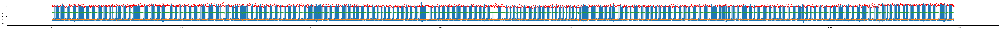

create_window


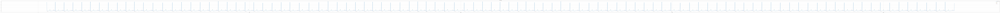

create_window
create_window
create_window
create_window
create_window


/usr/local/lib/python3.11/dist-packages/scipy/signal/_spectral_py.py:790: UserWarning: nperseg = 256 is greater than input length  = 11, using nperseg = 11
  freqs, _, Pxy = _spectral_helper(x, y, fs, window, nperseg, noverlap,
/usr/local/lib/python3.11/dist-packages/scipy/signal/_spectral_py.py:790: UserWarning: nperseg = 256 is greater than input length  = 12, using nperseg = 12
  freqs, _, Pxy = _spectral_helper(x, y, fs, window, nperseg, noverlap,
/usr/local/lib/python3.11/dist-packages/scipy/signal/_spectral_py.py:790: UserWarning: nperseg = 256 is greater than input length  = 13, using nperseg = 13
  freqs, _, Pxy = _spectral_helper(x, y, fs, window, nperseg, noverlap,
/usr/local/lib/python3.11/dist-packages/scipy/signal/_spectral_py.py:790: UserWarning: nperseg = 256 is greater than input length  = 14, using nperseg = 14
  freqs, _, Pxy = _spectral_helper(x, y, fs, window, nperseg, noverlap,
/usr/local/lib/python3.11/dist-packages/scipy/signal/_spectral_py.py:790: UserWarning: n

create_window
create_window
create_window
create_window
create_window
create_window
create_window
create_window
create_window
create_window


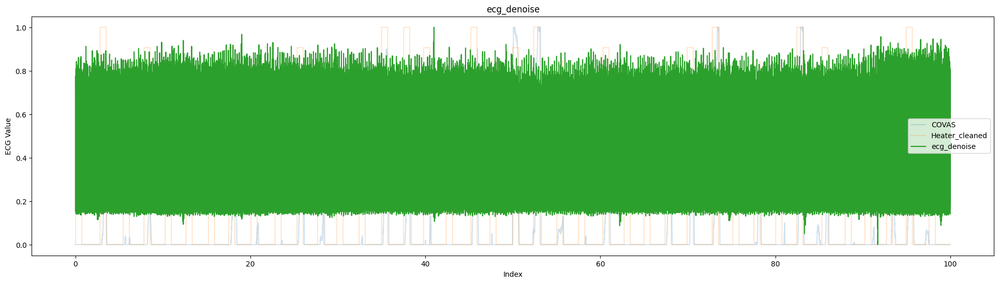

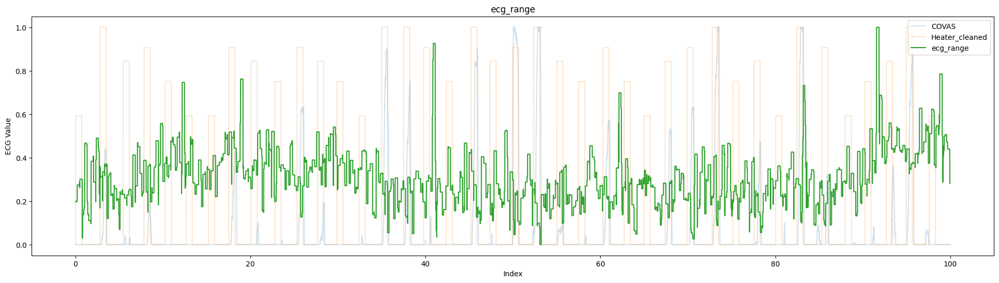

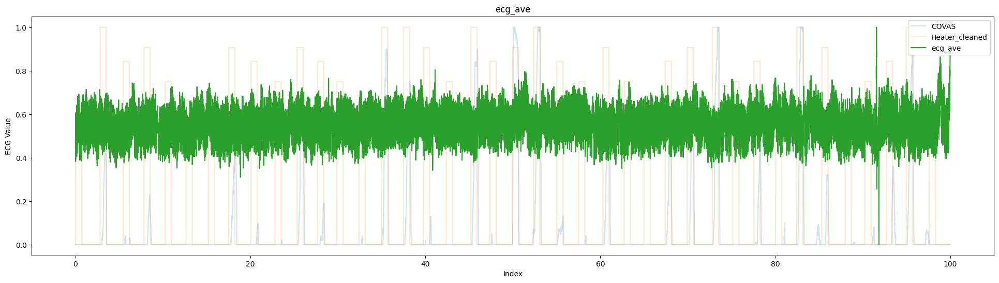

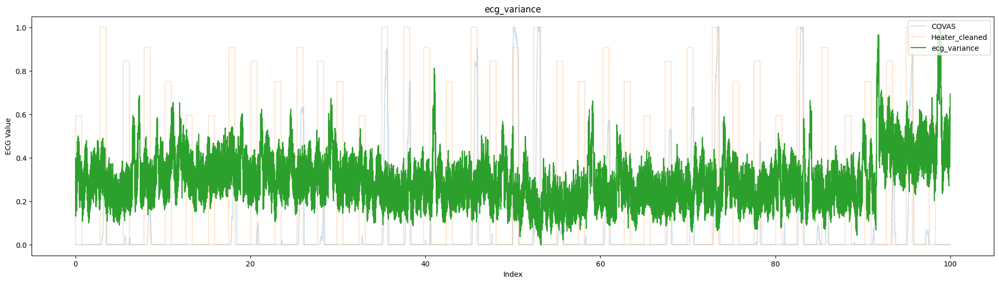

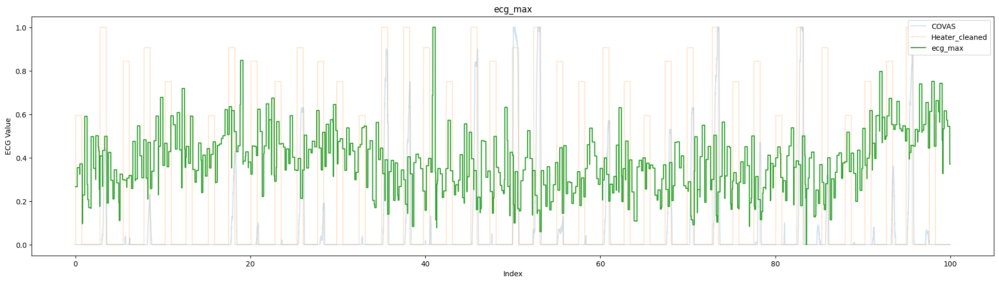

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


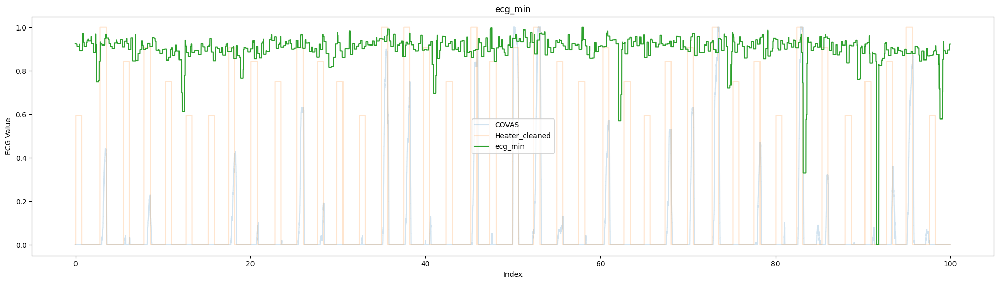

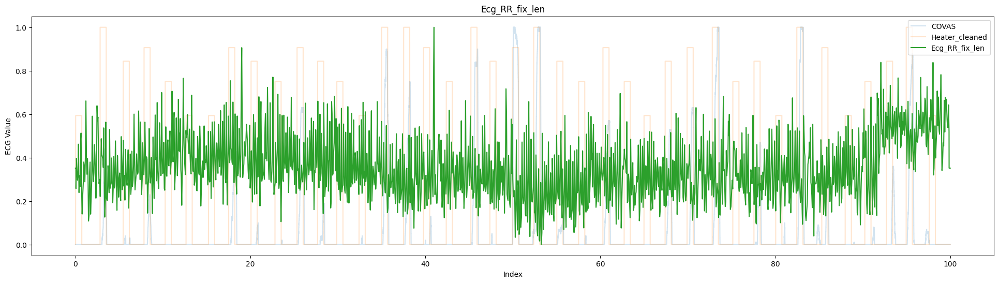

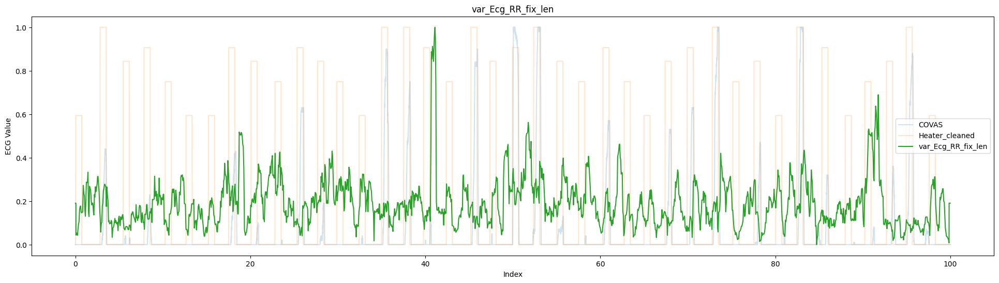

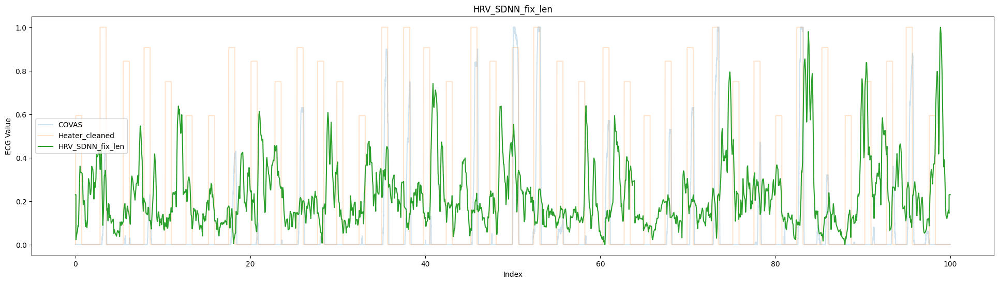

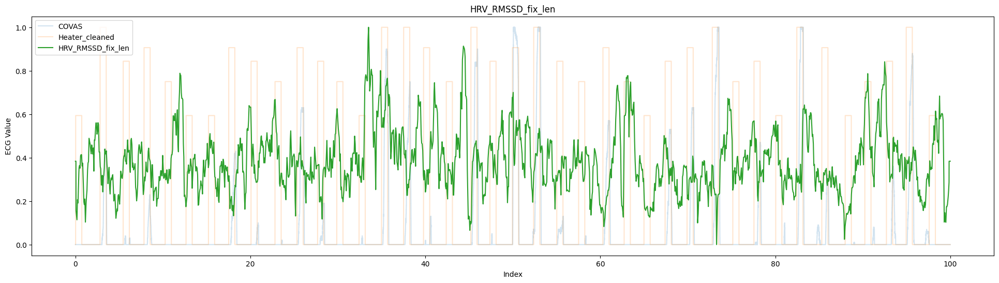

...

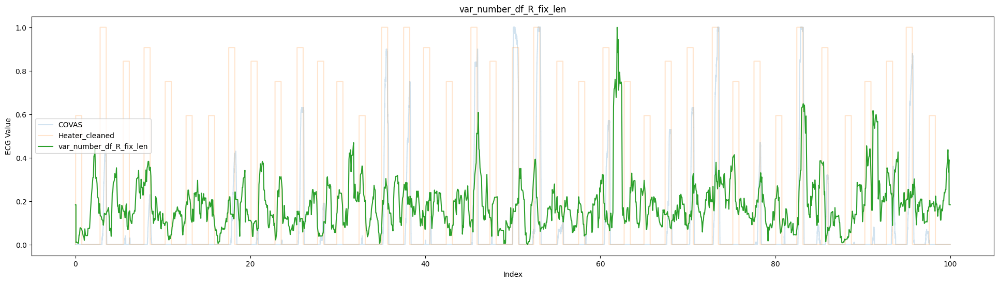

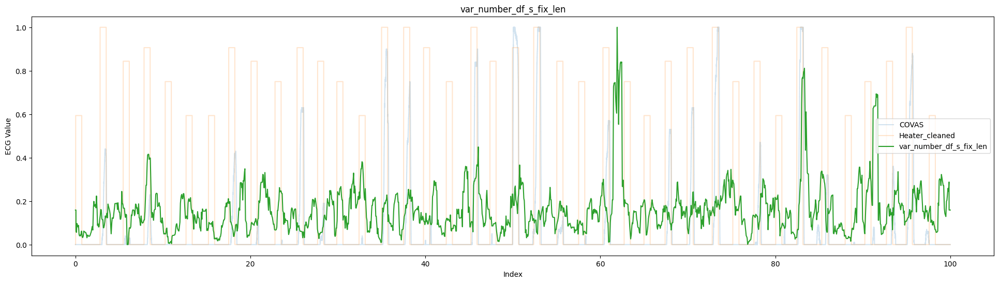

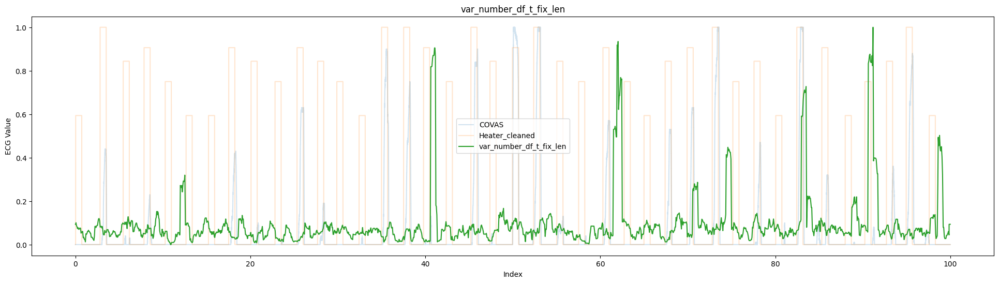

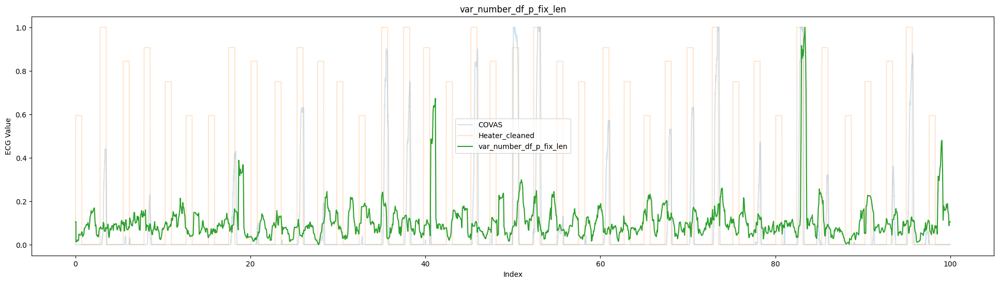

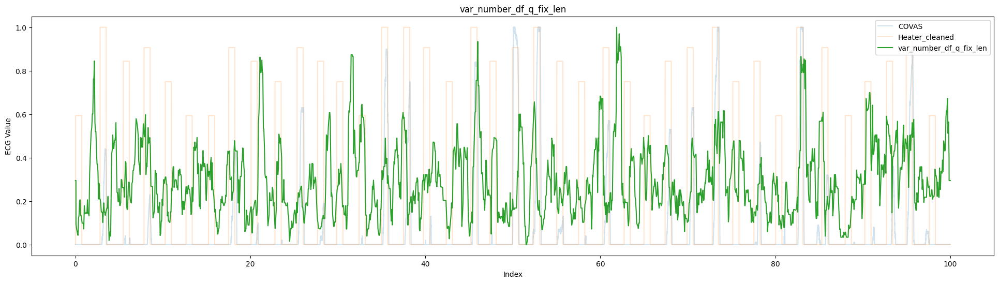

In [ ]:
dic_per_ecg = feature_ecg(ecg)

In [ ]:
i = 0
for key , list_data in dic_per_ecg.items():
  i = i + 1
  print(i , key, len(list_data) )

1 ecg_denoise 356221
2 ecg_range 356221
3 ecg_ave 356221
4 ecg_variance 356221
5 ecg_max 356221
6 ecg_min 356221
7 Ecg_RR_fix_len 356221
8 var_Ecg_RR_fix_len 356221
9 HRV_SDNN_fix_len 356221
10 HRV_RMSSD_fix_len 356221
11 HRV_PNN50_fix_len 356221
12 HRV_LF_HF_fix_len 356221
13 HRV_HF_fix_len 356221
14 HRV_LF_fix_len 356221
15 SQ_fix_len 356221
16 TQ_fix_len 356221
17 delta_s_R_fix_len 356221
18 delta_t_R_fix_len 356221
19 delta_q_R_fix_len 356221
20 var_SQ_fix_len 356221
21 var_TQ_fix_len 356221
22 var_delta_s_R_fix_len 356221
23 var_delta_t_R_fix_len 356221
24 var_delta_q_R_fix_len 356221
25 show_df_pec_SQ_fix_len 356221
26 show_df_pec_TQ_fix_len 356221
27 show_df_pec_delta_s_R_fix_len 356221
28 show_df_pec_delta_t_R_fix_len 356221
29 show_df_pec_delta_q_R_fix_len 356221
30 list_var(s_t)_fix_len 356221
31 list_mean(s_t)_fix_len 356221
32 list_sum(s_t)_fix_len 356221
33 list_min(s_t)_fix_len 356221
34 list_max(s_t)_fix_len 356221
35 list_df_var(s_t)_fix_len 356221
36 list_df_mean(s_t)_

In [ ]:
len(ecg)

356221

# Eda

## functiones

In [ ]:
def dphEDA(signal , fs = 2, padding = 2):
  len_signal = len(signal)
  new_data = []
  for i in range(2,len_signal-2):
    n = (-signal[i-2] - 8 * signal[i-1] + 8 * signal[i+1] + signal[i+2])/(12 * (1/fs))
    new_data.append(n)
  for i in range(padding):
    new_data.insert(0,0)
    new_data.append(0)
  return new_data

In [ ]:
import numpy as np
from scipy.signal import butter, filtfilt, hilbert

def compute_TVSymp(eda_signal, Fs):
    """
    محاسبه شاخص فعالیت سمپاتیک طیفی-زمانی (TVSymp) از سیگنال EDA با استفاده از VFCDM.

    ورودی‌ها:
       eda_signal: سیگنال EDA پیش‌پردازش‌شده (مثلاً پس از فیلتر کردن و بازنمونه‌برداری)
       Fs: نرخ نمونه‌برداری سیگنال به هرتز

    خروجی:
       TVSymp: شاخص فعالیت سمپاتیک طیفی-زمانی (دامنه لحظه‌ای سیگنال ترکیبی)
    """
    # تعیین باند فرکانسی هدف: 0.08 تا 0.24 هرتز
    freq_band = [0.08, 0.24]
    # انتخاب چند بسامد مرکزی به‌عنوان نمونه (برای مثال، 3 بسامد در این بازه)
    center_freqs = np.linspace(freq_band[0], freq_band[1], 3)

    # ایجاد بردار زمان برای سیگنال
    t = np.arange(len(eda_signal)) / Fs

    # طراحی فیلتر پایین‌گذر (Butterworth)
    # پس از دمودولاسیون، سیگنال به مرکز فرکانسی صفر منتقل می‌شود؛ بنابراین نیاز به فیلتر پایین‌گذر داریم.
    # انتخاب یک فرکانس قطع نسبتاً پایین، مثلاً 0.5 هرتز.
    cutoff = 0.5  # هرتز
    order = 4
    nyquist = 0.5 * Fs
    normal_cutoff = cutoff / nyquist
    b, a = butter(order, normal_cutoff, btype='low', analog=False)

    # جمع‌بندی مؤلفه‌های بازسازی‌شده در باند هدف
    combined = np.zeros(len(eda_signal), dtype=complex)

    for f0 in center_freqs:
        # دمودولاسیون: ضرب سیگنال در exp(-j 2π f0 t)
        demodulated = eda_signal * np.exp(-1j * 2 * np.pi * f0 * t)
        # اعمال فیلتر پایین‌گذر برای حذف مؤلفه‌های ناخواسته
        filtered = filtfilt(b, a, demodulated)
        # جمع کردن خروجی‌ها
        combined += filtered

    # محاسبه تبدیل هیلبرت (برای استخراج دامنه لحظه‌ای)
    analytic_signal = hilbert(np.real(combined))
    TVSymp = np.abs(analytic_signal)

    return TVSymp

### fix_len_eda

In [ ]:
def fix_len_eda(signal,
                len_traget,
                list_scale = [62 ,2 ]):
  scales = 1
  for i in list_scale:
    scales *= i

  new_signall = []
  for i in range(len(signal) - 1):
    d = signal[i + 1] - signal[i]
    sh = d / scales
    for i1 in range(scales):
      new_signall.append(signal[i] + i1 * sh)
  if len(new_signall) >len_traget:
    new_signall = new_signall[:len_traget]
  elif len(new_signall) <len_traget:
    new_signall = new_signall + [new_signall[-1]] * (len_traget - len(new_signall))
  return new_signall





## features

In [ ]:
eda_list = ['Eda_E4','Eda_RB']
data_signall = [df[eda] for eda in eda_list]


In [ ]:
!git clone https://github.com/lciti/cvxEDA.git
%cd /content/cvxEDA/src
!python cvxEDA.py install

import cvxEDA
import numpy as np
import matplotlib.pyplot as plt


Cloning into 'cvxEDA'...
remote: Enumerating objects: 82, done.
remote: Counting objects: 100% (48/48), done.
remote: Compressing objects: 100% (37/37), done.
remote: Total 82 (delta 21), reused 35 (delta 11), pack-reused 34 (from 1)
Receiving objects: 100% (82/82), 35.82 KiB | 7.16 MiB/s, done.
Resolving deltas: 100% (33/33), done.
/content/cvxEDA/src


In [ ]:
from scipy.signal import medfilt
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import butter, filtfilt
import numpy as np
from scipy.signal import decimate

In [ ]:
def feature_eda(
    eda,
    window_size = 1000,
    show = True,
    fix_len = True
    ):
  len_data = len(eda)
  features: dict[str, list] = {}

  # df signall

  eda_df = df_signal(eda)
  features['eda_df'] = eda_df


  # 62 N -> 1N
  ## کاهش فرکانس به حدود 4 هرتز
  eda_raw = np.array(eda.tolist())
  eda_downsampled_4Hz = decimate(eda_raw, 62, ftype='fir')
  signal_filtered = medfilt(eda_downsampled_4Hz, kernel_size=3)
  ## کاهش فرکانس به حدود 2 هرتز
  eda_downsampled_2Hz = decimate(signal_filtered, 2, ftype='fir')
  fs = 2.0
  # فیلتر

  # طراحی فیلتر بالاگذر Butterworth
  cutoff = 0.01  # فرکانس قطع به هرتز
  order = 4      # مرتبه فیلتر
  nyquist = 0.5 * fs
  normal_cutoff = cutoff / nyquist  # نرمال‌سازی فرکانس قطع

  # طراحی ضرایب فیلتر
  b, a = butter(order, normal_cutoff, btype='high', analog=False)

  # اعمال فیلتر به سیگنال با استفاده از filtfilt برای جلوگیری از تأخیر فازی
  signal_filtered = filtfilt(b, a, eda_downsampled_2Hz)

  # استخراج سیگنال های
  # فرض کنید y یک بردار numpy حاوی سیگنال EDA ضبط‌شده با نرخ نمونه‌برداری 2 هرتز است.
  # در اینجا فرض بر این است که متغیر signal_filtered از قبل تعریف شده و شامل سیگنال EDA است.


  n_samples = len(signal_filtered)
  time = np.arange(n_samples) / fs

  # استانداردسازی سیگنال (z-score normalization)
  yn = (signal_filtered - np.mean(signal_filtered)) / np.std(signal_filtered)

  # اجرای cvxEDA؛ توجه کنید که ورودی delta برابر با 1./fs می‌باشد.
  [r, p, t_est, l, d, e, obj] = cvxEDA.cvxEDA(yn, 1.0 / fs)
  features['r_eda'] = r
  features['p_eda'] = p
  features['t_est_eda'] = t_est
  #features['l_eda'] = l
  features['e_eda'] = e

  dphEDA_r = dphEDA(r)
  features['dphEDA_r_eda'] = dphEDA_r

  # فرض کنید eda_signal و Fs تعریف شده‌اند.
  TVSymp = compute_TVSymp(signal_filtered , 2)
  features['TVSymp_eda'] = TVSymp


  if fix_len:
    # Create a new dictionary to store the fixed-length features
    fixed_features = {}
    for key, value in features.items():
      if len(value) != len_data:
       new_value = fix_len_eda(value,
                               len(eda),
                               list_scale = [62 ,2 ])
       fixed_features[key + '_fix_len'] = new_value
      else:
        fixed_features[key] = value
    # Update the original features dictionary with the new features
    #features.update(fixed_features)
  else :
    fixed_features = features
  if show:
    show_plotes(fixed_features.items())
  return fixed_features






     pcost       dcost       gap    pres   dres
 0: -8.5619e+02 -8.2816e+02  7e+03  8e+01  1e+00
 1: -8.7680e+02 -2.7289e+03  3e+03  3e+01  4e-01
 2: -8.9617e+02 -2.8599e+03  3e+03  2e+01  3e-01
 3: -9.4065e+02 -1.5646e+03  7e+02  6e+00  7e-02
 4: -1.0357e+03 -1.4926e+03  5e+02  3e+00  4e-02
 5: -1.1812e+03 -1.4851e+03  3e+02  2e+00  2e-02
 6: -1.2773e+03 -1.5072e+03  2e+02  1e+00  1e-02
 7: -1.3317e+03 -1.5060e+03  2e+02  5e-01  7e-03
 8: -1.3529e+03 -1.4459e+03  9e+01  2e-01  3e-03
 9: -1.3603e+03 -1.4303e+03  7e+01  1e-01  2e-03
10: -1.3661e+03 -1.3950e+03  3e+01  4e-02  6e-04
11: -1.3689e+03 -1.3791e+03  1e+01  1e-02  1e-04
12: -1.3704e+03 -1.3724e+03  2e+00  2e-03  2e-05
13: -1.3708e+03 -1.3712e+03  3e-01  2e-04  3e-06
14: -1.3709e+03 -1.3709e+03  4e-02  2e-05  2e-07
15: -1.3709e+03 -1.3709e+03  2e-03  8e-07  1e-08
16: -1.3709e+03 -1.3709e+03  8e-05  3e-08  3e-10
17: -1.3709e+03 -1.3709e+03  2e-06  5e-10  6e-12
18: -1.3709e+03 -1.3709e+03  7e-08  6e-12  4e-13
Optimal solution foun

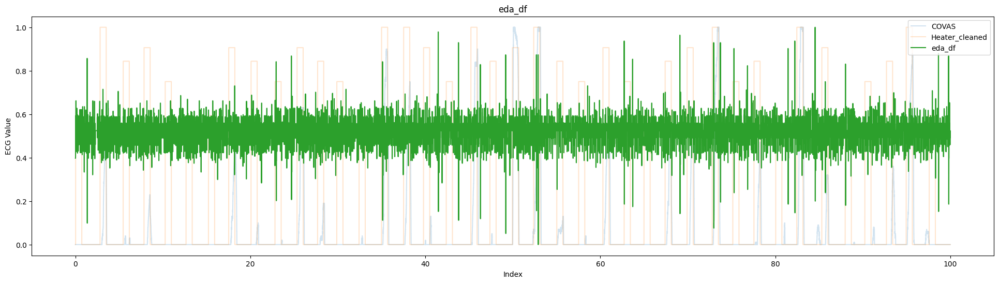

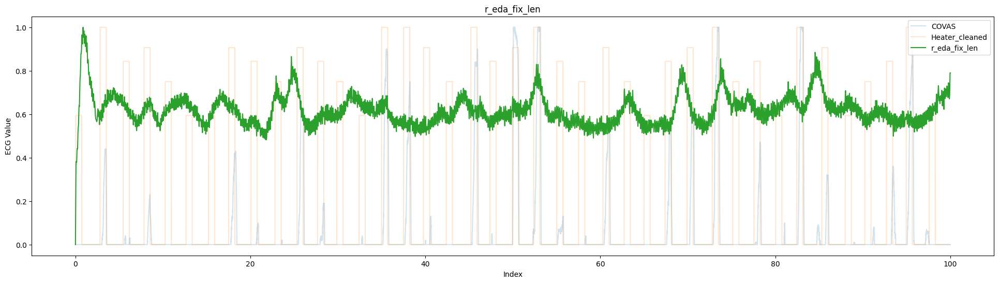

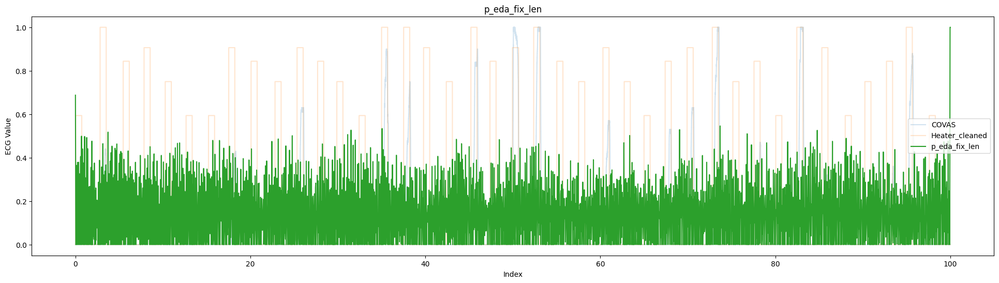

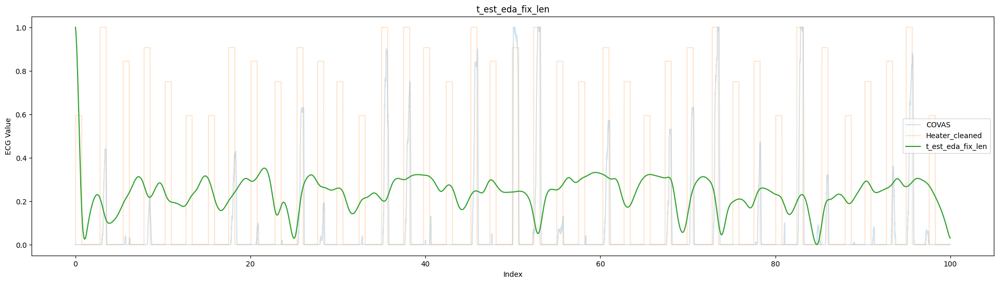

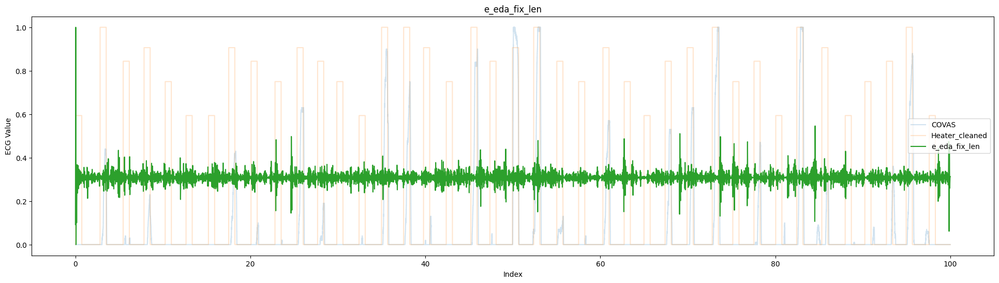

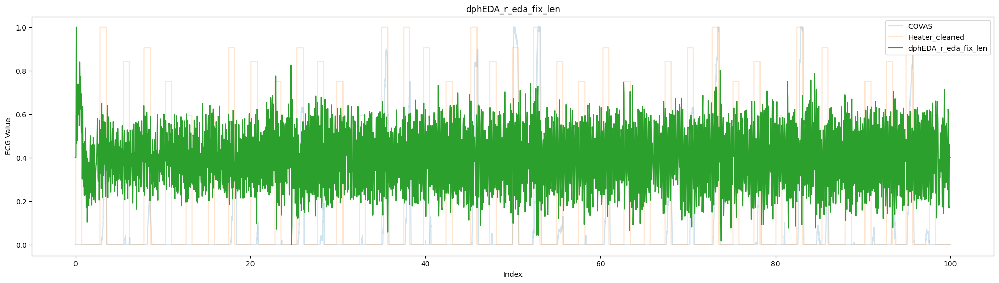

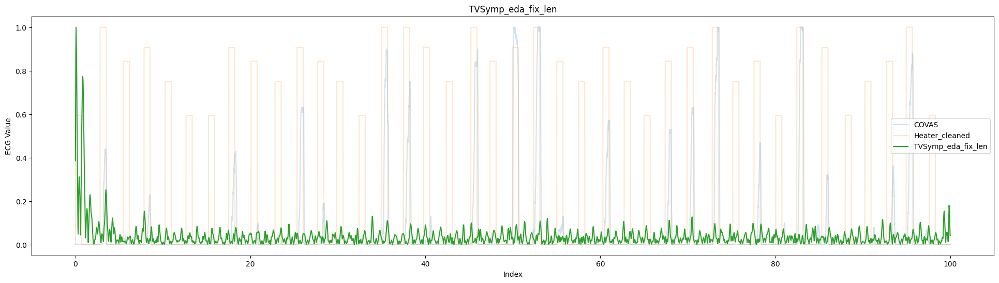

In [ ]:
dic_per_eda_1 = feature_eda(
    data_signall[0],
    window_size = 1000,
    show = True,
    fix_len = True
    )

In [ ]:
i = 0
for key , list_data in dic_per_eda_1.items():
  i = i + 1
  print(i , key, len(list_data) )

1 eda_df 356221
2 r_eda_fix_len 356221
3 p_eda_fix_len 356221
4 t_est_eda_fix_len 356221
5 e_eda_fix_len 356221
6 dphEDA_r_eda_fix_len 356221
7 TVSymp_eda_fix_len 356221


In [ ]:
len(data_signall[0].tolist())

356221

     pcost       dcost       gap    pres   dres
 0: -1.3810e+03 -1.3783e+03  7e+03  6e+01  9e-01
 1: -1.3873e+03 -3.2760e+03  3e+03  3e+01  4e-01
 2: -1.4016e+03 -3.5015e+03  3e+03  2e+01  3e-01
 3: -1.4133e+03 -2.1567e+03  8e+02  6e+00  8e-02
 4: -1.4148e+03 -1.5510e+03  1e+02  8e-01  1e-02
 5: -1.4152e+03 -1.4837e+03  7e+01  4e-01  5e-03
 6: -1.4154e+03 -1.4426e+03  3e+01  1e-01  2e-03
 7: -1.4165e+03 -1.4245e+03  8e+00  3e-02  4e-04
 8: -1.4183e+03 -1.4206e+03  2e+00  3e-03  5e-05
 9: -1.4196e+03 -1.4203e+03  7e-01  8e-04  1e-05
10: -1.4201e+03 -1.4202e+03  2e-01  1e-04  2e-06
11: -1.4202e+03 -1.4202e+03  5e-02  2e-05  2e-07
12: -1.4202e+03 -1.4202e+03  1e-02  3e-06  4e-08
13: -1.4202e+03 -1.4202e+03  3e-03  4e-07  6e-09
14: -1.4202e+03 -1.4202e+03  7e-04  7e-08  1e-09
15: -1.4202e+03 -1.4202e+03  2e-04  1e-08  2e-10
16: -1.4202e+03 -1.4202e+03  3e-05  2e-09  3e-11
17: -1.4202e+03 -1.4202e+03  4e-06  2e-10  3e-12
18: -1.4202e+03 -1.4202e+03  5e-07  2e-11  2e-13
Optimal solution foun

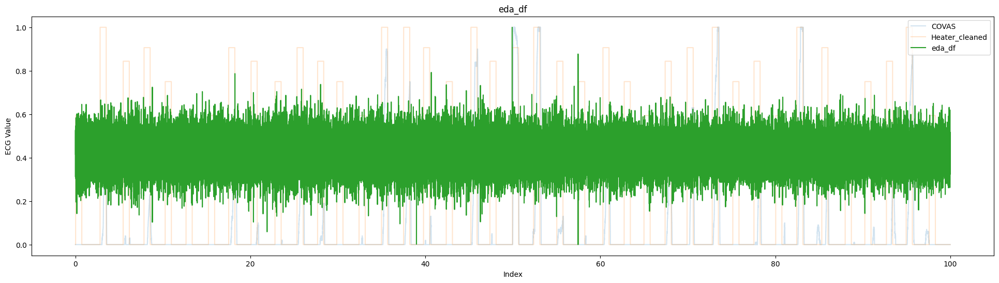

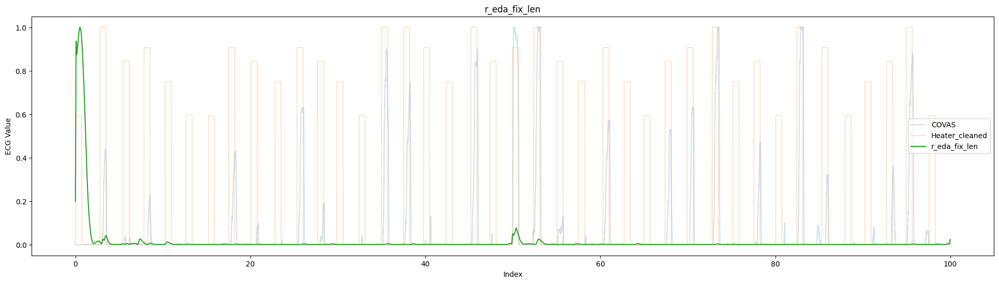

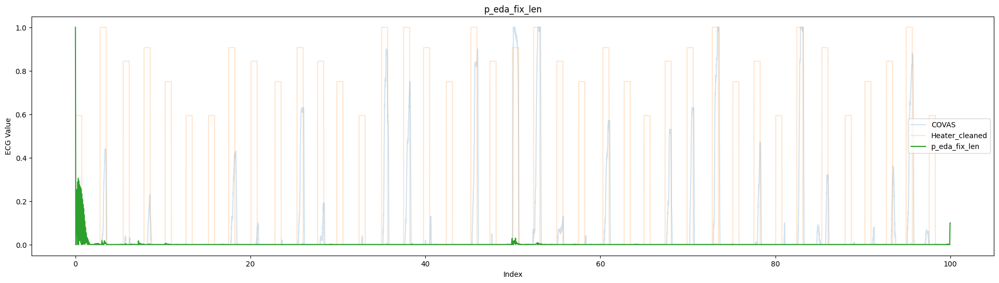

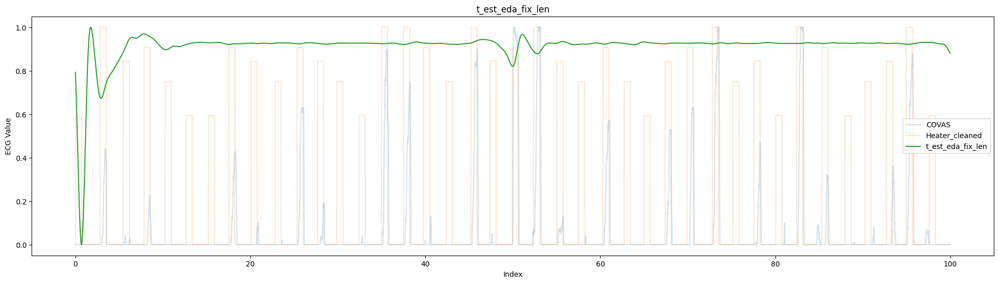

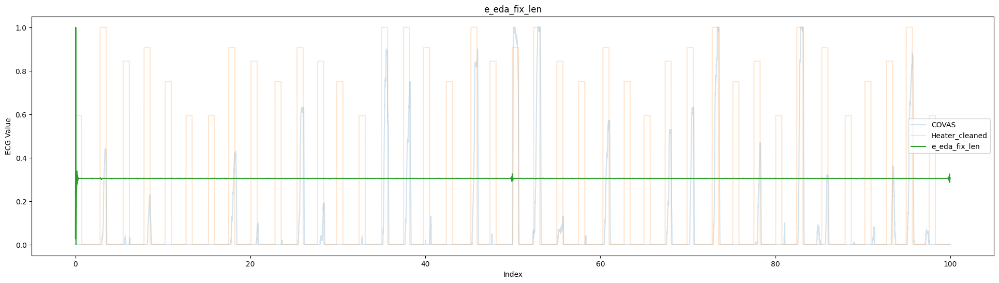

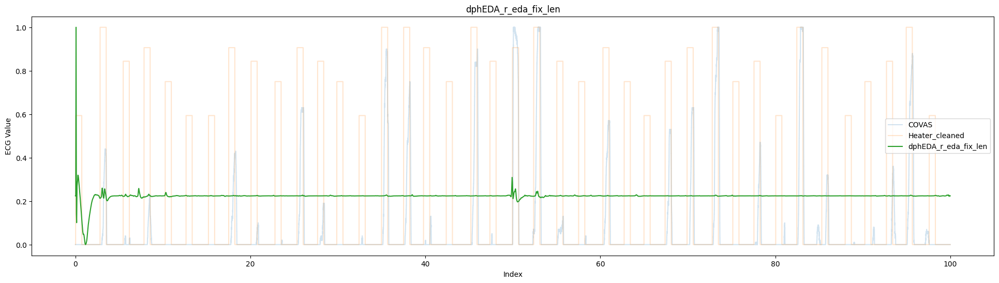

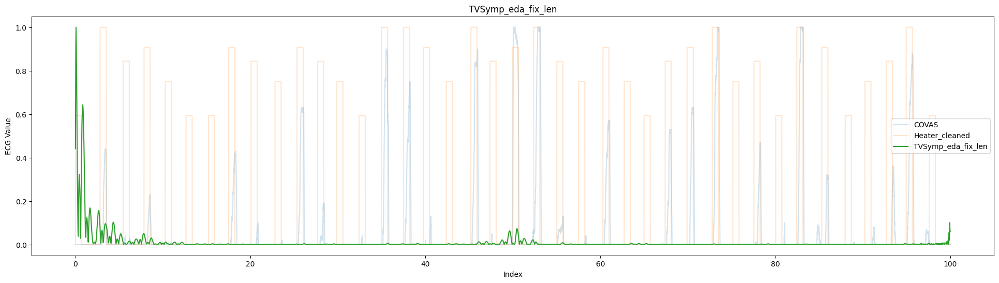

In [ ]:
dic_per_eda_2 = feature_eda(
    data_signall[1],
    window_size = 1000,
    show = True,
    fix_len = True
    )

In [ ]:
i = 0
for key , list_data in dic_per_eda_2.items():
  i = i + 1
  print(i , key, len(list_data) )

1 eda_df 356221
2 r_eda_fix_len 356221
3 p_eda_fix_len 356221
4 t_est_eda_fix_len 356221
5 e_eda_fix_len 356221
6 dphEDA_r_eda_fix_len 356221
7 TVSymp_eda_fix_len 356221


# Emg

## functiones

### filter

In [ ]:
from scipy.signal import butter, filtfilt
import numpy as np
import matplotlib.pyplot as plt

# تابع برای طراحی فیلتر باند گذر
def bandpass_filter(data, lowcut, highcut, fs, order=4):
    nyquist = 0.5 * fs  # فرکانس نیکوئیست
    low = lowcut / nyquist
    high = highcut / nyquist
    b, a = butter(order, [low, high], btype='band')
    return filtfilt(b, a, data)


## features

In [ ]:
Emg = df['Emg']
def feature_Emg(
  Emg,
  window_for_all = None,
  window_size_ave = 1000,
  window_size_var = 300,
  window_size_range = 300,
  window_size_range_var = 300,
  window_size_max =300 ,
  window_size_max_var = 300,
  window_size_min = 300,
  window_size_min_var = 300,
  show_plotes = True
                ):
  Emg = list(Emg)
  features: dict[str, list] = {}

  if window_for_all is not None:
    print(f' window all size  : {window_for_all}')
    Emg = signal_window(Emg, window_for_all)
  # ave
  Emg_ave = ave_window(Emg, window_size_ave)
  features['Emg_ave'] = Emg_ave

  # variance
  var_Emg = variance_window(Emg, window_size_var)
  features['var_Emg'] = var_Emg


  # range
  range_Emg = range_window(Emg, window_size_range)
  features['range_Emg'] = range_Emg


  # var range
  var_range = variance_window(range_Emg,window_size_range_var)
  features['var_range_Emg'] = var_range


  # max
  max_Emg = max_window(Emg, window_size_max)
  features['max_Emg'] = max_Emg
  # var max
  var_max_Emg =variance_window(max_Emg, window_size_max_var)
  features['var_max_Emg'] = var_max_Emg
  # min
  min_Emg = min_window(Emg,window_size_min)
  features['min_Emg'] = min_Emg
  # var min
  var_min_Emg = variance_window(min_Emg, window_size_min_var)
  features['var_min_Emg'] = var_min_Emg









  # show plortes
  if show_plotes:
    # ave
    get_plot(list_labels + [Emg_ave] , ['COVAS', 'Heater_cleaned', 'Emg'] , size_plot = (120 , 6), list_sacale = None, list_alpha=None)
    # var
    get_plot(list_labels + [var_Emg] , ['COVAS', 'Heater_cleaned', 'var_bund_Emg'] , size_plot = (120 * .2 , 6), list_sacale = None, list_alpha=None)

    # ragen
    get_plot(list_labels + [range_Emg] , ['COVAS', 'Heater_cleaned', 'range_bund_Emg'] , size_plot = (120 * .2 , 6), list_sacale = None, list_alpha=None)
    # var ragne
    get_plot(list_labels + [var_range] , ['COVAS', 'Heater_cleaned', 'var_range_bund_Emg'] , size_plot = (120 * .2 , 6), list_sacale = None, list_alpha=None, alphaes = 0.2)

    # max
    get_plot(list_labels + [max_Emg] , ['COVAS', 'Heater_cleaned', 'max_bund_Emg'] , size_plot = (120 * .2 , 6), list_sacale = None, list_alpha=None)
    # var max
    get_plot(list_labels + [var_max_Emg] , ['COVAS', 'Heater_cleaned', 'var_max_bund_Emg'] , size_plot = (120 * .2 , 6), list_sacale = None, list_alpha=None)
    # min

    get_plot(list_labels + [min_Emg] , ['COVAS', 'Heater_cleaned', 'min_bund_Emg'] , size_plot = (120 * .2 , 6), list_sacale = None, list_alpha=None)
    # var min
    get_plot(list_labels + [var_min_Emg] , ['COVAS', 'Heater_cleaned', 'var_min_bund_Emg'] , size_plot = (120 * .2 , 6), list_sacale = None, list_alpha=None)



  return features



 window all size  : 300
create_window
create_window
create_window


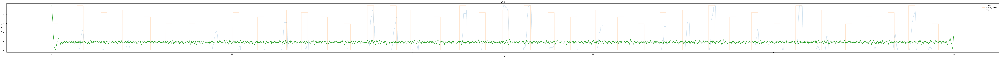

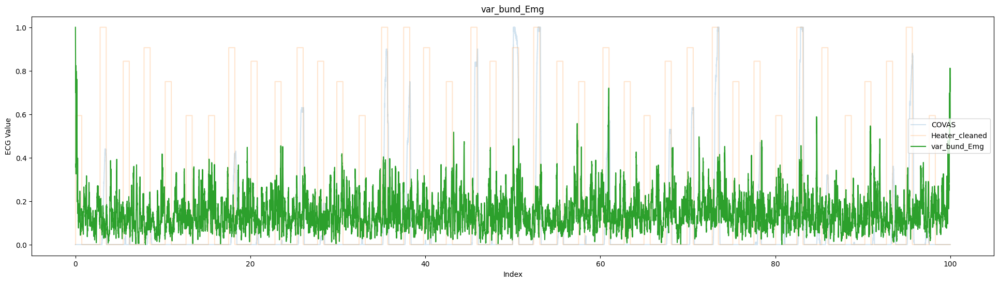

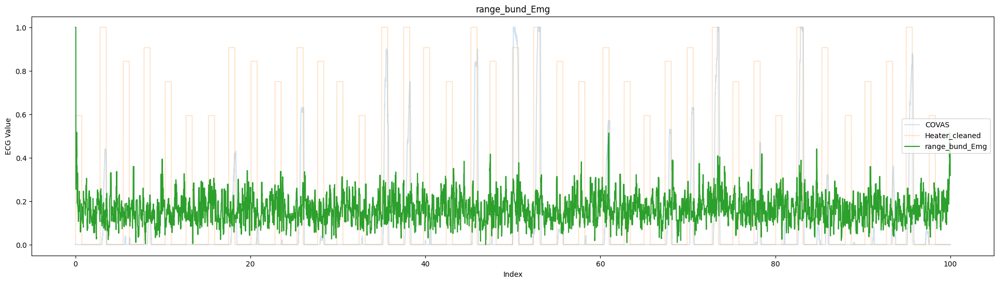

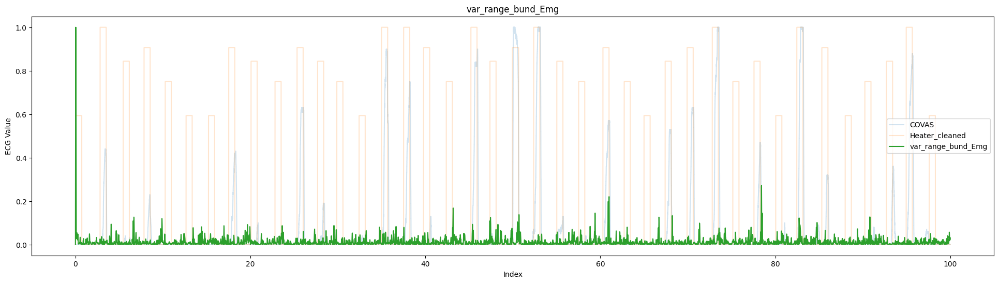

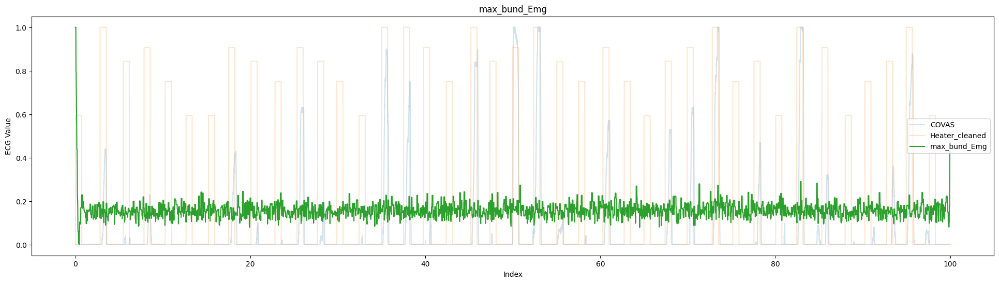

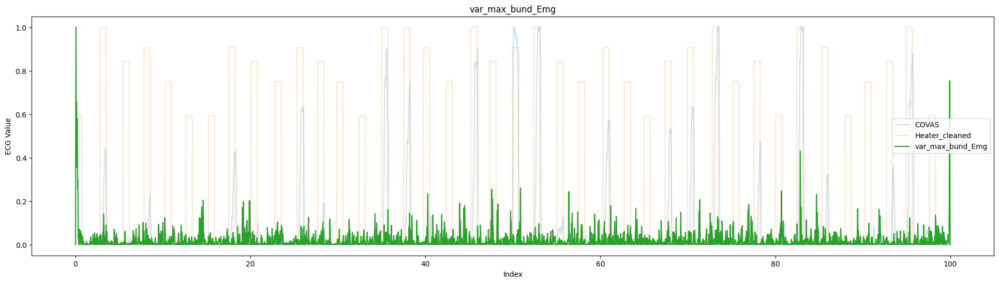

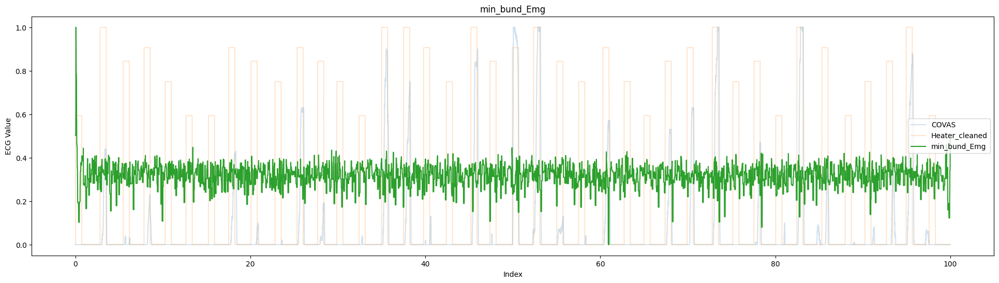

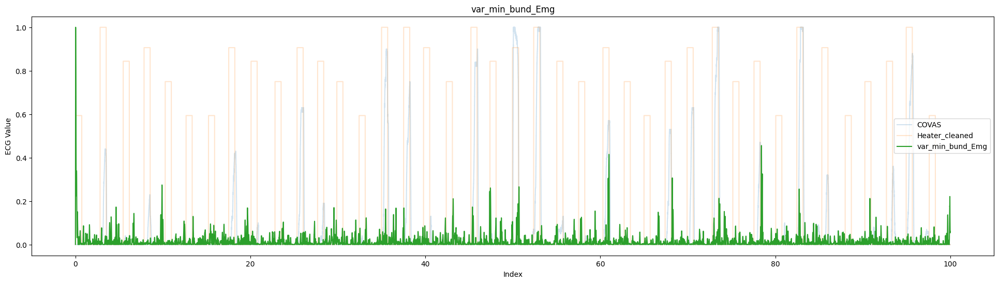

In [ ]:
Emg_band = bandpass_filter(Emg , .1 , 5 , 250 )
dic_per_emg = feature_Emg(
  Emg_band,300
                )

In [ ]:
i = 0
for key , list_data in dic_per_emg.items():
  i = i + 1
  print(i , key, len(list_data) )

1 Emg_ave 356221
2 var_Emg 356221
3 range_Emg 356221
4 var_range_Emg 356221
5 max_Emg 356221
6 var_max_Emg 356221
7 min_Emg 356221
8 var_min_Emg 356221


In [ ]:
len(Emg)

356221

 window all size  : 300
create_window
create_window
create_window


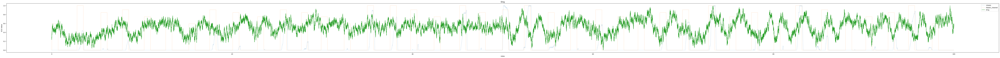

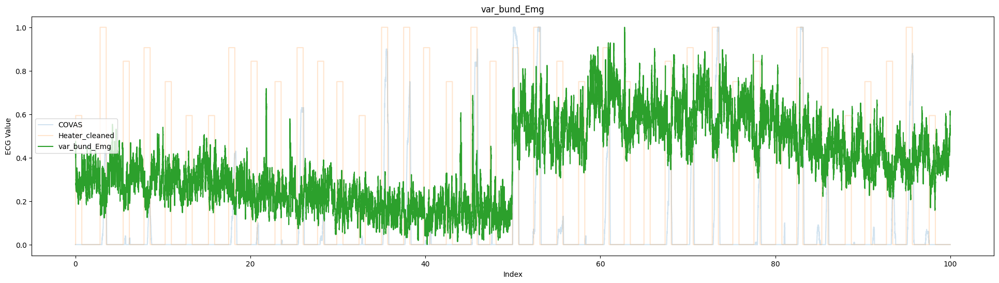

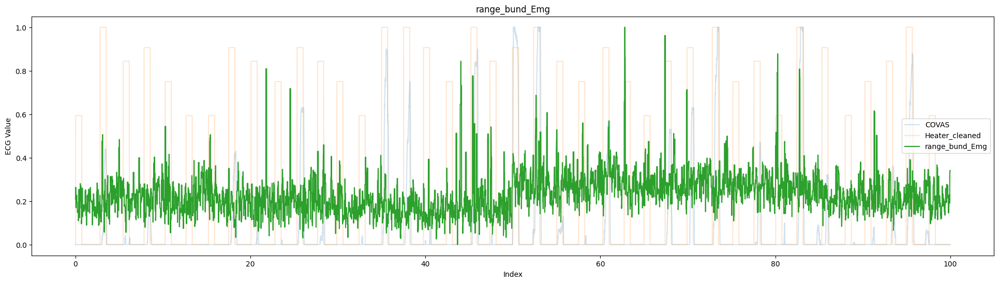

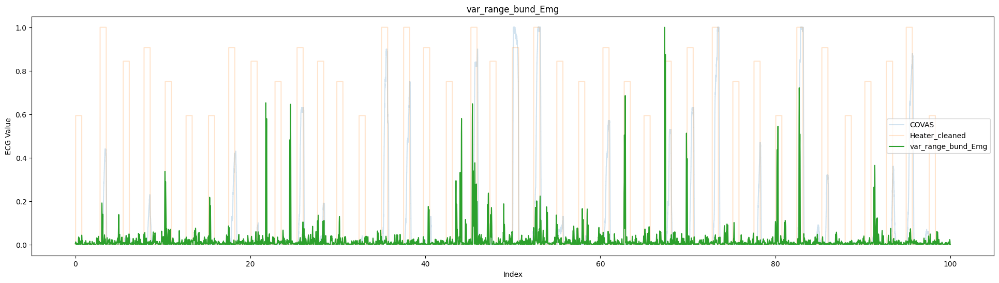

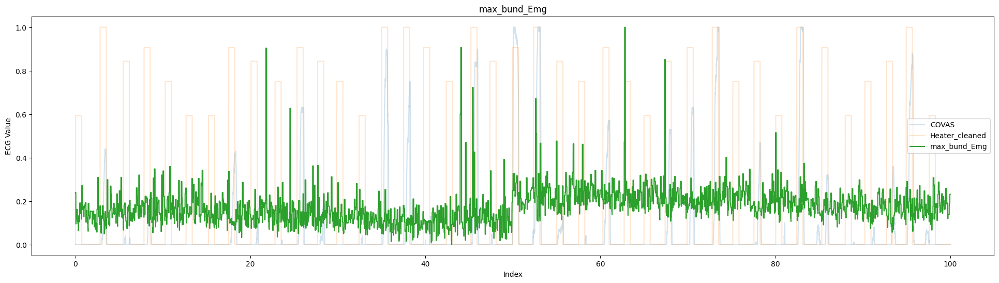

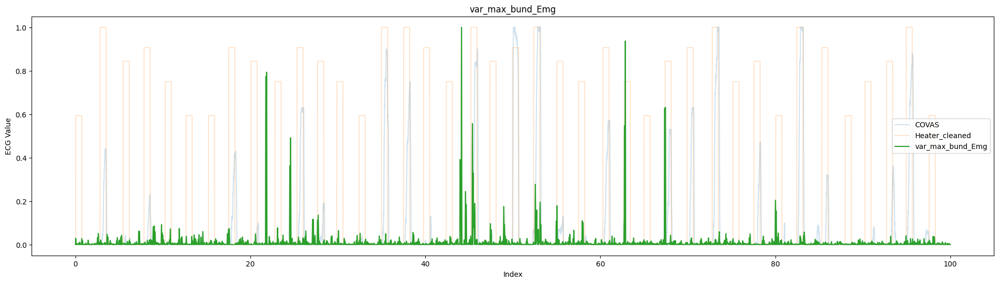

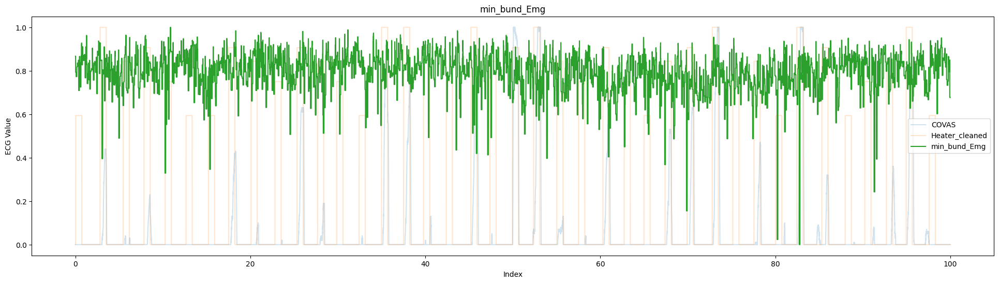

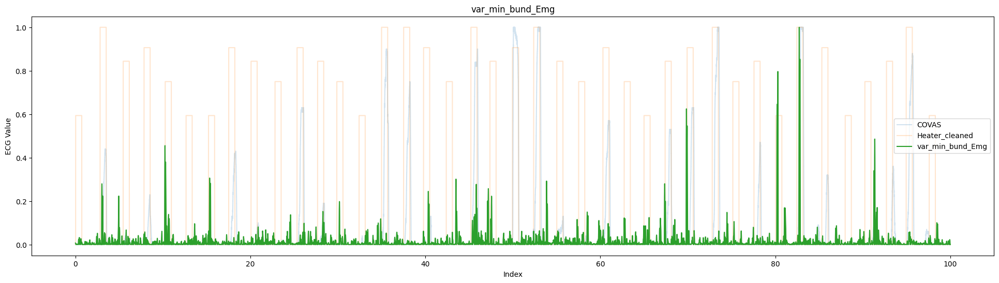

In [ ]:
dic_per_emg_2 = feature_Emg(
  Emg,300
                )

In [ ]:
i = 0
for key , list_data in dic_per_emg_2.items():
  i = i + 1
  print(i , key, len(list_data) )

1 Emg_ave 356221
2 var_Emg 356221
3 range_Emg 356221
4 var_range_Emg 356221
5 max_Emg 356221
6 var_max_Emg 356221
7 min_Emg 356221
8 var_min_Emg 356221


# Resp

## functiones

### filter

In [ ]:
from scipy.signal import butter, filtfilt
import numpy as np
import matplotlib.pyplot as plt

# تابع برای طراحی فیلتر باند گذر
def bandpass_filter(data, lowcut, highcut, fs, order=4):
    nyquist = 0.5 * fs  # فرکانس نیکوئیست
    low = lowcut / nyquist
    high = highcut / nyquist
    b, a = butter(order, [low, high], btype='band')
    return filtfilt(b, a, data)


### R_R

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks

def RR_resp(signal, min_f = 128, show_plot = True, size_plot = (120 , 3)):
  windows = signal_window(signal, min_f, step = min_f//10,save_len = False )
  max_in_window = []
  for window in windows:
    max_in_window.append(np.max(window))
  n = 0
  list_number_max = []
  for i in range(len(max_in_window)-1):
    if max_in_window[i] == max_in_window[i+1]:
      n = n + 1
      if n == 9 :
        list_number_max.append(i)
        n = 0
    else:
      n = 0
  rr = []
  for i in list_number_max :
    i = int(i)
    index = np.where(max_in_window[i] == windows[i])
    #print(int(index[0]))
    rr.append(i *(min_f//10) + int(index[0])  )
  print(rr)
  if show_plot:
    time = np.linspace(0, len(signal), len(signal))
    plt.figure(figsize = size_plot)
    plt.plot(time, signal, label='Resp')
    #plt.plot(time, averaged_signal, label='ave ECG')
    #plt.plot(time, max_signal, label=f'max ECG * {Percentage}')
    plt.scatter(time[rr], signal[rr], color='red', label='rr')
    plt.show()


  return rr

### fix_len_resp

In [ ]:
def fix_len_resp(seconds, list_data, len_data, N = 0):
  new_signall = []
  for i in range(len_data):
    new_signall.append(N)
  mean_data = sum(list_data)/len(list_data)
  for i in range(seconds[0]):
    new_signall[i]= mean_data
  for i in range(seconds[-1], len(new_signall)):
    new_signall[i]= mean_data
  for i in range(len(seconds) -1):
    d = list_data[i + 1] -  list_data[i]
    sh = d / (seconds[i + 1] - seconds[i])
    for i1 in range(int(seconds[i]), int(seconds[i +1])):
      new_signall[i1] = list_data[i] + sh * (i1 - seconds[i])

  return new_signall

## features

In [ ]:
Resp = df['Resp']

In [ ]:
def feature_resp(
    Resp,
    window_for_all = 400,
    show = True,
    fix_len = True
    ):
  len_data = len(Resp)
  features: dict[str, list] = {}


  Resp_band_signall = bandpass_filter(Resp , .1 , 5 , 250 )

  if window_for_all is not None:
    print(f' window all size  : {window_for_all}')

    Resp_band = signal_window(Resp_band_signall, window_for_all)



  # var

  var_resp = variance_window(Resp_band, window_for_all)
  features['var_resp'] = var_resp

  # range
  range_resp = range_window(Resp_band, window_for_all)
  features['range_resp'] = range_resp
  ## var range
  var_range_resp = variance_window(range_resp, window_for_all)
  features['var_range_resp'] = var_range_resp
  # max
  max_resp = max_window(Resp_band, window_for_all)
  features['max_resp'] = max_resp
  ## var max
  var_max_resp = variance_window(max_resp, window_for_all)
  features['var_max_resp'] = var_max_resp
  # min
  min_resp = min_window(Resp_band, window_for_all)
  features['min_resp'] = min_resp
  ## var min
  var_min_resp = variance_window(min_resp, window_for_all)
  features['var_min_resp'] = var_min_resp

  # R R
  rr_resp_signal = RR_resp(Resp_band_signall, min_f = 128  *4, show_plot = show)

  # df R R
  df_RR_resp = df_signal(rr_resp_signal)
  features['df_RR_resp'] = df_RR_resp
  # var df R R
  var_df_RR_resp = variance_window(df_RR_resp, 3)
  features['var_df_RR_resp'] = var_df_RR_resp
  # show plotes
  if show:
    show_plotes(features.items())
  if fix_len:
    # Create a new dictionary to store the fixed-length features
    fixed_features = {}
    for key, value in features.items():
      if len(value) != len_data:
       new_value = fix_len_resp(rr_resp_signal, value, len_data, N = 0)
       fixed_features[key + '_fix_len'] = new_value
      else:
        fixed_features[key] = value
    # Update the original features dictionary with the new features
    #features.update(fixed_features)
    return fixed_features
  return features




 window all size  : 400
create_window
create_window
create_window


<ipython-input-64-6e99334c70c4>:25: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rr.append(i *(min_f//10) + int(index[0])  )


[1185, 2168, 3306, 4270, 4972, 5812, 6823, 7854, 9073, 10444, 11504, 12368, 13205, 13946, 14761, 15515, 16340, 17111, 17871, 18621, 19468, 20473, 21388, 22252, 23034, 23938, 24949, 25703, 26486, 27365, 28227, 29053, 30018, 30843, 31669, 32489, 33323, 34242, 35068, 35921, 36722, 37536, 38378, 39293, 40075, 40957, 41902, 42779, 43927, 45074, 45622, 46514, 47318, 48156, 48951, 49812, 50682, 51587, 52398, 53223, 54066, 54976, 55804, 56600, 57505, 58328, 59093, 59857, 60631, 61390, 62242, 63081, 64133, 65032, 65845, 66625, 67736, 69007, 70037, 70846, 71686, 72523, 73268, 73991, 74751, 75431, 76312, 77234, 78162, 79225, 80350, 81492, 82372, 83238, 84229, 84930, 85623, 86408, 87187, 87926, 88711, 89510, 90277, 91156, 92050, 92932, 93710, 94538, 95378, 96099, 96814, 97830, 98691, 99536, 100298, 101132, 101906, 102677, 103663, 104427, 105448, 106131, 106763, 107448, 108363, 109240, 110142, 110972, 111734, 112487, 113236, 114056, 114889, 115616, 116419, 117158, 117972, 118794, 119629, 120437, 12

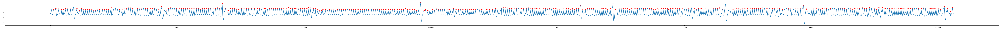

create_window


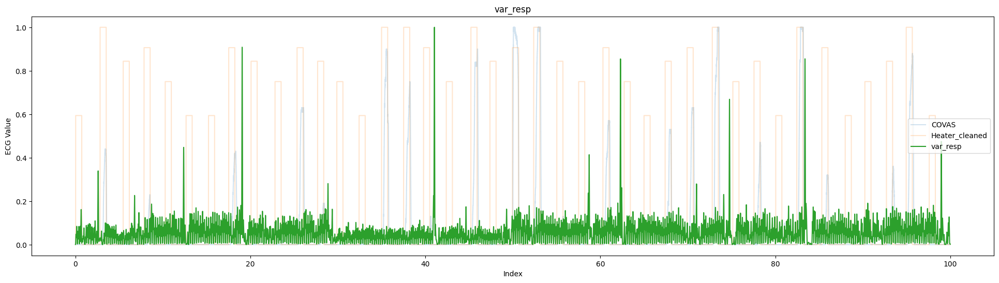

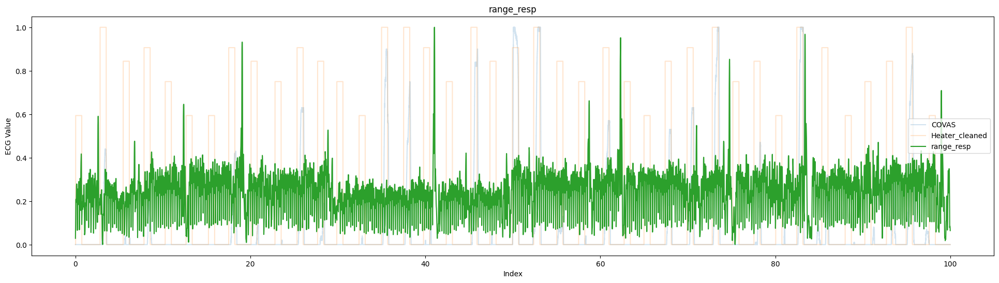

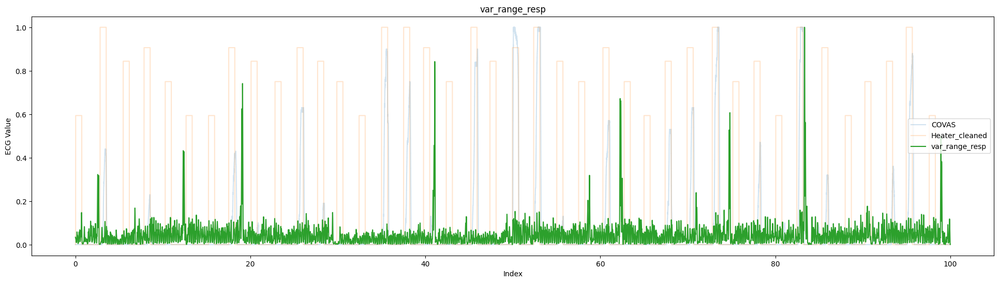

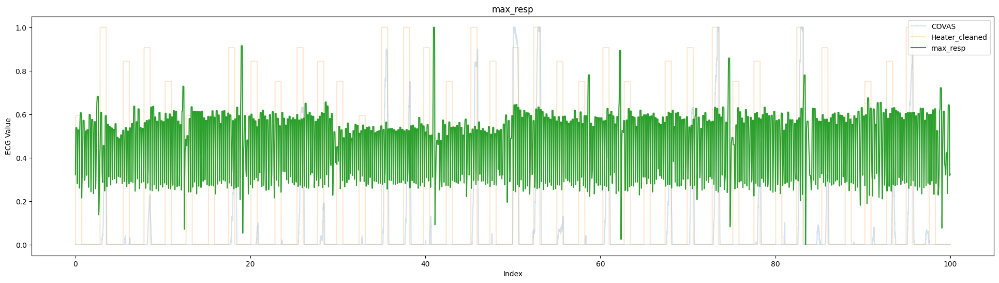

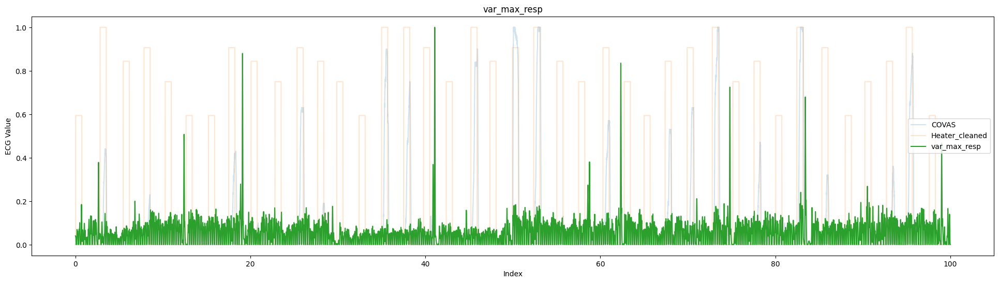

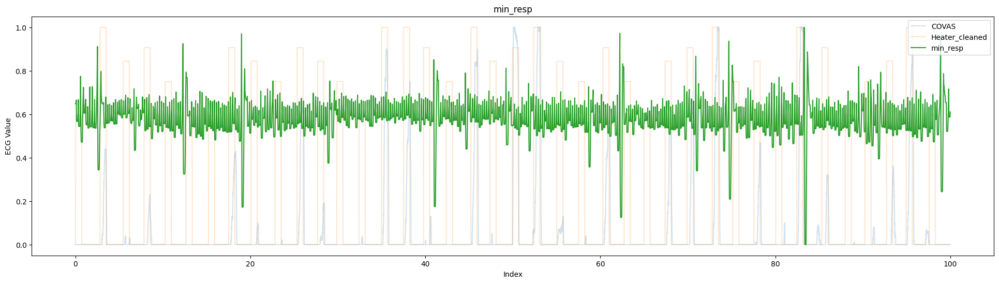

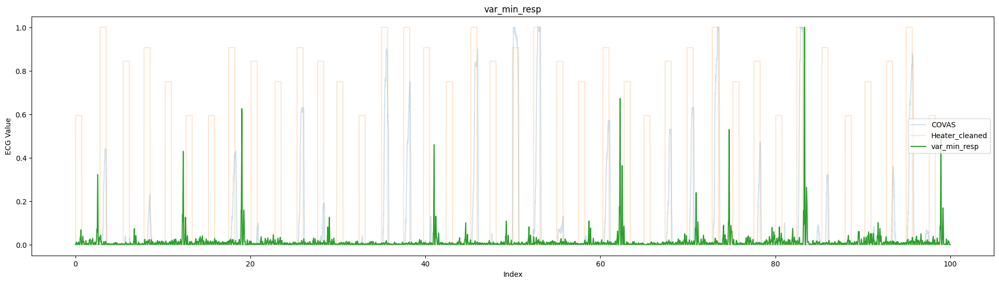

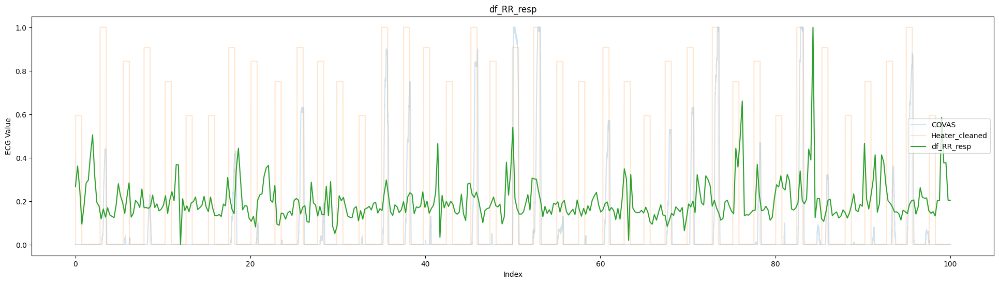

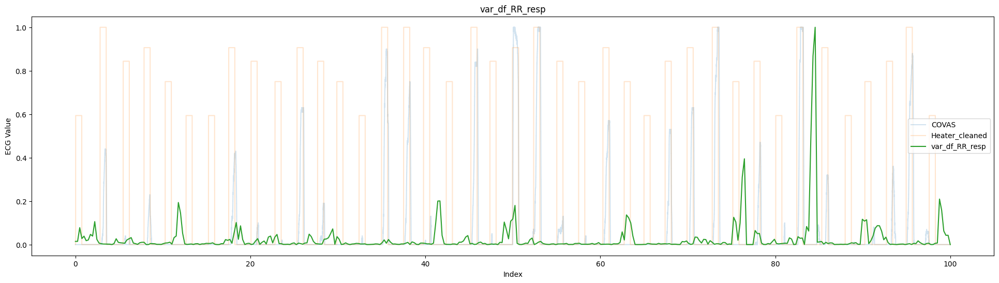

In [ ]:
dic_per_resp = feature_resp(
    Resp,
    window_for_all = 400,
    show = True,
    fix_len = True
    )

In [ ]:
len(Resp)

356221

In [ ]:
i = 0
for key , list_data in dic_per_resp.items():
  i = i + 1
  print(i , key, len(list_data) )

1 var_resp 356221
2 range_resp 356221
3 var_range_resp 356221
4 max_resp 356221
5 var_max_resp 356221
6 min_resp 356221
7 var_min_resp 356221
8 df_RR_resp_fix_len 356221
9 var_df_RR_resp_fix_len 356221


# add all feature to dataFrame

In [ ]:
def merge_dicts_unique(dicts):
    """
    ادغام لیستی از دیکشنری‌ها؛
    اگر کلیدی تکراری باشد، به‌جای بازنویسی،
    نام را با _2, _3, … شماره‌گذاری می‌کند.
    """
    merged = {}
    for d in dicts:
        for key, val in d.items():
            if key not in merged:
                merged[key] = val
            else:
                # پیدا کردن شماره بعدی برای کلید تکراری
                i = 2
                new_key = f"{key}_{i}"
                while new_key in merged:
                    i += 1
                    new_key = f"{key}_{i}"
                merged[new_key] = val
    return merged

# مثال استفاده:
dicts = [
    dic_per_resp,
    dic_per_emg_2,
    dic_per_emg,
    dic_per_eda_1,
    dic_per_eda_2,
    dic_per_ecg
]

# ادغام با تغییر نام کلیدهای تکراری
merged = merge_dicts_unique(dicts)

# اضافه کردن همهٔ ستون‌ها یک‌جا
df1 = df.assign(**merged)


In [ ]:
df1.keys()

Index(['Seconds', 'Bvp', 'Eda_E4', 'Tmp', 'Ibi', 'Hr', 'Resp', 'Eda_RB', 'Ecg',
       'Emg',
       ...
       'number_df_R_fix_len', 'number_df_s_fix_len', 'number_df_t_fix_len',
       'number_df_p_fix_len', 'number_df_q_fix_len', 'var_number_df_R_fix_len',
       'var_number_df_s_fix_len', 'var_number_df_t_fix_len',
       'var_number_df_p_fix_len', 'var_number_df_q_fix_len'],
      dtype='object', length=101)

# Save new dataFrame

In [ ]:
# prompt: save dataFrame df1 in '/content/drive/MyDrive/dataset/new_dataFrame_for_test.csv'

df1.to_csv('/content/drive/MyDrive/dataset/new_dataFrame_for_test.csv', index=False)

In [ ]:
df1 = pd.read_csv('/content/drive/MyDrive/dataset/new_dataFrame_for_test.csv')

# Conrrelationes

In [ ]:
# یا با sklearn
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaled_values = scaler.fit_transform(df)
df= pd.DataFrame(scaled_values,
                                  columns=df.columns,
                                  index=df.index)



In [ ]:
def conrrelationes(dataFrame,name):
  Con_spearman = dataFrame.corr(method='spearman')

  Con_spearman_sorted_Heater_cleaned = Con_spearman.sort_values(by='Heater_cleaned', ascending=False)
  # 1) compute max key‐length
  max_len = max(len(str(k)) for k in Con_spearman_sorted.index)

  # 2) iterate over the series directly
  print('------------------------------------------')
  print('Heater_cleaned')
  for key, value in Con_spearman_sorted_Heater_cleaned['Heater_cleaned'].items():
      # key: left-aligned in a field of width max_len
      # value: fixed 7 decimal places, right-aligned in a width of (1 + 1 + 7) = 9 chars
      print(f'{key:<{max_len}}  {value:>9.7f}')

  Con_spearman_sorted_COVAS = Con_spearman.sort_values(by='COVAS', ascending=False)
  print('----------------------------------------------------------')
  print('COVAS')
  for key, value in Con_spearman_sorted_COVAS['COVAS'].items():
      # key: left-aligned in a field of width max_len
      # value: fixed 7 decimal places, right-aligned in a width of (1 + 1 + 7) = 9 chars
      print(f'{key:<{max_len}}  {value:>9.7f}')

  return Con_spearman_sorted_Heater_cleaned, Con_spearman_sorted_COVAS

In [ ]:
Conrrelationes_spearman = conrrelationes(df1,'spearman')

------------------------------------------
Heater_cleaned
Heater_cleaned                 1.0000000
Heater [C]                     0.7871576
COVAS                          0.4636795
ecg_min                        0.0744246
df_RR_resp_fix_len             0.0664395
min_resp                       0.0562937
HRV_LF_HF_fix_len              0.0536522
list_min(s_t)_fix_len          0.0509489
dphEDA_r_eda_fix_len_2         0.0488618
var_range_Emg                  0.0462365
var_min_Emg                    0.0364465
list_df_min(s_t)_fix_len       0.0362899
var_max_resp                   0.0308933
var_max_Emg_2                  0.0293461
var_number_df_R_fix_len        0.0233859
var_TQ_fix_len                 0.0224109
delta_q_R_fix_len              0.0216484
var_max_Emg                    0.0207399
Ibi                            0.0140906
TVSymp_eda_fix_len_2           0.0131135
r_eda_fix_len                  0.0125928
var_range_resp                 0.0111049
Tmp                            0.0091452

In [ ]:
Conrrelationes_pearson = conrrelationes(df1,'pearson')

------------------------------------------
Heater_cleaned
Heater_cleaned                 1.0000000
Heater [C]                     0.7871576
COVAS                          0.4636795
ecg_min                        0.0744246
df_RR_resp_fix_len             0.0664395
min_resp                       0.0562937
HRV_LF_HF_fix_len              0.0536522
list_min(s_t)_fix_len          0.0509489
dphEDA_r_eda_fix_len_2         0.0488618
var_range_Emg                  0.0462365
var_min_Emg                    0.0364465
list_df_min(s_t)_fix_len       0.0362899
var_max_resp                   0.0308933
var_max_Emg_2                  0.0293461
var_number_df_R_fix_len        0.0233859
var_TQ_fix_len                 0.0224109
delta_q_R_fix_len              0.0216484
var_max_Emg                    0.0207399
Ibi                            0.0140906
TVSymp_eda_fix_len_2           0.0131135
r_eda_fix_len                  0.0125928
var_range_resp                 0.0111049
Tmp                            0.0091452

In [ ]:
Conrrelationes_kendall = conrrelationes(df1,'kendall')

------------------------------------------
Heater_cleaned
Heater_cleaned                 1.0000000
Heater [C]                     0.7871576
COVAS                          0.4636795
ecg_min                        0.0744246
df_RR_resp_fix_len             0.0664395
min_resp                       0.0562937
HRV_LF_HF_fix_len              0.0536522
list_min(s_t)_fix_len          0.0509489
dphEDA_r_eda_fix_len_2         0.0488618
var_range_Emg                  0.0462365
var_min_Emg                    0.0364465
list_df_min(s_t)_fix_len       0.0362899
var_max_resp                   0.0308933
var_max_Emg_2                  0.0293461
var_number_df_R_fix_len        0.0233859
var_TQ_fix_len                 0.0224109
delta_q_R_fix_len              0.0216484
var_max_Emg                    0.0207399
Ibi                            0.0140906
TVSymp_eda_fix_len_2           0.0131135
r_eda_fix_len                  0.0125928
var_range_resp                 0.0111049
Tmp                            0.0091452